# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [13]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

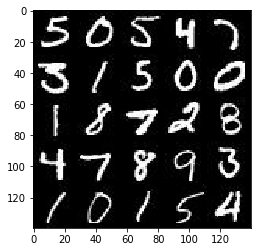

In [14]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

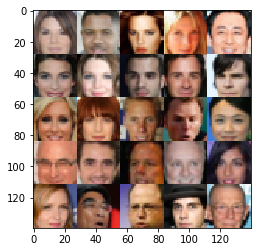

In [15]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [16]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.4.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [17]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels])
    z = tf.placeholder(tf.float32, [None, z_dim])
    lr = tf.placeholder(tf.float32)
    
    return real, z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [18]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        alpha = 0.2
        keep_prob = 0.5
        # Input layer is 28x28x3
        
        # Conv Layer - 14*14*56
        conv_layer = tf.layers.conv2d(images,56, 5, strides=(2,2), padding='SAME', use_bias=True,
                                     kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        # Now 14*14*56
        
        # Conv Layer - 7*7*80
        conv_layer = tf.layers.conv2d(conv_layer, 80, 5, strides=(2,2), padding='SAME', use_bias=False,
                                     kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.layers.batch_normalization(conv_layer, training=True)
        #Add dropout
        conv_layer = tf.contrib.layers.dropout(conv_layer, keep_prob, is_training=True)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        #Now 7*7*80
        
        # Conv Layer - 4*4*128
        conv_layer = tf.layers.conv2d(conv_layer, 128, 5, strides=(2,2), padding='SAME', use_bias=False,
                                     kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.layers.batch_normalization(conv_layer, training=True)
        #Add dropout
        conv_layer = tf.contrib.layers.dropout(conv_layer, keep_prob, is_training=True)
        conv_layer = tf.maximum(alpha * conv_layer, conv_layer)
        #Now 4*4*128
        
        flat = tf.reshape(conv_layer, (-1, 4*4*128))

        logits = tf.layers.dense(flat, 1)
        
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [19]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=not(is_train)):
        keep_prob = 0.8
        
        # layer 1 - Dense Layer
        x = tf.layers.dense(z, 3*3*512, use_bias=True, activation=None)
        x = tf.reshape(x, (-1, 3, 3, 512))
        x = tf.layers.batch_normalization(x, training=is_train)
        # Relu as per DCGAN paper
        x = tf.nn.relu(x)

        #Conv Layer - 4*4*320
        strides=1
        conv_layer = tf.layers.conv2d_transpose(x, 320, 2, strides, 'valid', use_bias=False, activation=None, 
                                                kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.layers.batch_normalization(conv_layer, training=is_train)
        
        #Add dropout
        conv_layer = tf.contrib.layers.dropout(conv_layer, keep_prob, is_training=is_train)
        # Relu as per DCGAN paper
        conv_layer = tf.nn.relu(conv_layer)


        #Conv Layer - 7*7*256
        strides=1
        conv_layer = tf.layers.conv2d_transpose(conv_layer, 256, 4, strides, 'valid', use_bias=False, activation=None, 
                                                kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.layers.batch_normalization(conv_layer, training=is_train)
        #Add dropout
        conv_layer = tf.contrib.layers.dropout(conv_layer, keep_prob, is_training=is_train)
        # Relu as per DCGAN paper
        conv_layer = tf.nn.relu(conv_layer)
        
        
        #Conv Layer - 14*14*128
        strides=2
        conv_layer = tf.layers.conv2d_transpose(conv_layer, 128,5, strides, 'same', use_bias=False, activation=None,
                                               kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer = tf.layers.batch_normalization(conv_layer, training=is_train)
        #Add dropout
        conv_layer = tf.contrib.layers.dropout(conv_layer, keep_prob, is_training=is_train)
        # Relu as per DCGAN paper
        conv_layer = tf.nn.relu(conv_layer)
        

        #Logits - Conv Layer - 28,28,3 
        logits = tf.layers.conv2d_transpose(conv_layer, out_channel_dim,5, strides, 'same', use_bias=True, activation=None,
                                           kernel_initializer=tf.contrib.layers.xavier_initializer())
        
        # tanh output
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [20]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_l_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_l_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_l_real + d_l_fake

    return d_loss, g_loss
    

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [21]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [22]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [23]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    import numpy as np
    show= 1000
    print_=50

    input_real, input_z, lr = model_inputs(data_shape[1],data_shape[2],data_shape[3], z_dim)

    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
        
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    iterations=0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                batch_images = batch_images * 2
                
                # TODO: Train Model
                # Sample random noise
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr:learning_rate})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images,lr:learning_rate})
                
                #show_generator_output(sess, 1, input_z, data_shape[3], data_image_mode)
                
                if iterations % print_ ==0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))                
                iterations+=1
                if iterations % show == 0:
                    show_generator_output(sess, 58, input_z, data_shape[3], data_image_mode)
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
        print("Final : Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))                
        show_generator_output(sess, 58, input_z, data_shape[3], data_image_mode)                
 

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/4... Discriminator Loss: 3.1575... Generator Loss: 0.1432
Epoch 1/4... Discriminator Loss: 1.8026... Generator Loss: 6.0046
Epoch 1/4... Discriminator Loss: 2.0509... Generator Loss: 0.5263
Epoch 1/4... Discriminator Loss: 0.7460... Generator Loss: 1.7909
Epoch 1/4... Discriminator Loss: 0.5806... Generator Loss: 1.4441
Epoch 1/4... Discriminator Loss: 2.3358... Generator Loss: 0.2929
Epoch 1/4... Discriminator Loss: 1.2418... Generator Loss: 1.0929
Epoch 1/4... Discriminator Loss: 1.1534... Generator Loss: 2.4858
Epoch 1/4... Discriminator Loss: 0.4464... Generator Loss: 5.8060
Epoch 1/4... Discriminator Loss: 0.3239... Generator Loss: 2.2409
Epoch 1/4... Discriminator Loss: 1.1731... Generator Loss: 0.8943
Epoch 1/4... Discriminator Loss: 0.9271... Generator Loss: 1.4872
Epoch 1/4... Discriminator Loss: 0.9492... Generator Loss: 1.7693
Epoch 1/4... Discriminator Loss: 1.8114... Generator Loss: 0.8207
Epoch 1/4... Discriminator Loss: 0.8770... Generator Loss: 1.0904
Epoch 1/4.

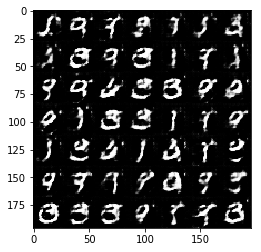

Epoch 1/4... Discriminator Loss: 1.2334... Generator Loss: 0.7759
Epoch 1/4... Discriminator Loss: 1.0242... Generator Loss: 1.1657
Epoch 1/4... Discriminator Loss: 0.9085... Generator Loss: 1.7574
Epoch 1/4... Discriminator Loss: 1.3846... Generator Loss: 1.0555
Epoch 1/4... Discriminator Loss: 1.2225... Generator Loss: 0.4553
Epoch 1/4... Discriminator Loss: 1.1604... Generator Loss: 0.8291
Epoch 1/4... Discriminator Loss: 1.1347... Generator Loss: 1.0254
Epoch 1/4... Discriminator Loss: 1.1983... Generator Loss: 1.4859
Epoch 1/4... Discriminator Loss: 1.4742... Generator Loss: 0.3940
Epoch 1/4... Discriminator Loss: 1.3525... Generator Loss: 0.5957
Epoch 1/4... Discriminator Loss: 1.1127... Generator Loss: 0.5947
Epoch 1/4... Discriminator Loss: 1.3321... Generator Loss: 0.5766
Epoch 1/4... Discriminator Loss: 1.4172... Generator Loss: 1.1727
Epoch 1/4... Discriminator Loss: 0.9714... Generator Loss: 1.2396
Epoch 1/4... Discriminator Loss: 1.1756... Generator Loss: 1.0647
Epoch 1/4.

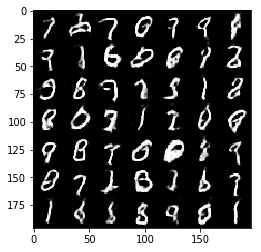

Epoch 1/4... Discriminator Loss: 1.4407... Generator Loss: 1.0802
Epoch 1/4... Discriminator Loss: 1.3048... Generator Loss: 0.8044
Epoch 1/4... Discriminator Loss: 1.2782... Generator Loss: 0.7245
Epoch 1/4... Discriminator Loss: 1.0741... Generator Loss: 0.8033
Epoch 1/4... Discriminator Loss: 1.2834... Generator Loss: 1.0257
Epoch 1/4... Discriminator Loss: 1.3156... Generator Loss: 0.5918
Epoch 1/4... Discriminator Loss: 1.1021... Generator Loss: 0.7968
Epoch 1/4... Discriminator Loss: 1.1932... Generator Loss: 0.7029
Epoch 1/4... Discriminator Loss: 1.1855... Generator Loss: 0.9144
Epoch 1/4... Discriminator Loss: 1.3924... Generator Loss: 0.6448
Epoch 1/4... Discriminator Loss: 1.3024... Generator Loss: 0.7203
Epoch 1/4... Discriminator Loss: 1.5469... Generator Loss: 0.4355
Epoch 1/4... Discriminator Loss: 1.4599... Generator Loss: 0.6026
Epoch 1/4... Discriminator Loss: 1.1928... Generator Loss: 0.8085
Epoch 1/4... Discriminator Loss: 1.2518... Generator Loss: 0.7860
Epoch 1/4.

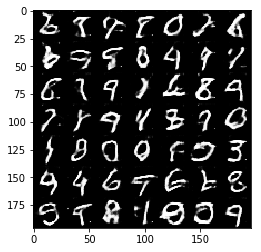

Epoch 1/4... Discriminator Loss: 1.4160... Generator Loss: 0.7305
Epoch 1/4... Discriminator Loss: 1.2461... Generator Loss: 0.5316
Epoch 1/4... Discriminator Loss: 1.2173... Generator Loss: 0.5959
Epoch 1/4... Discriminator Loss: 1.1399... Generator Loss: 0.5801
Epoch 1/4... Discriminator Loss: 1.1972... Generator Loss: 1.0125
Epoch 1/4... Discriminator Loss: 1.3204... Generator Loss: 0.6824
Epoch 1/4... Discriminator Loss: 1.6067... Generator Loss: 0.7668
Epoch 1/4... Discriminator Loss: 1.4408... Generator Loss: 0.6410
Epoch 1/4... Discriminator Loss: 1.0527... Generator Loss: 0.9436
Epoch 1/4... Discriminator Loss: 1.7266... Generator Loss: 0.4698
Epoch 1/4... Discriminator Loss: 1.1157... Generator Loss: 1.1704
Epoch 1/4... Discriminator Loss: 1.1975... Generator Loss: 0.9473
Epoch 1/4... Discriminator Loss: 1.2477... Generator Loss: 1.0517
Epoch 1/4... Discriminator Loss: 1.3612... Generator Loss: 0.5877
Epoch 1/4... Discriminator Loss: 1.4438... Generator Loss: 0.6573
Epoch 2/4.

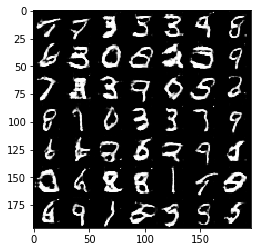

Epoch 2/4... Discriminator Loss: 1.1008... Generator Loss: 0.7681
Epoch 2/4... Discriminator Loss: 1.1762... Generator Loss: 0.9631
Epoch 2/4... Discriminator Loss: 1.0152... Generator Loss: 0.8923
Epoch 2/4... Discriminator Loss: 1.1410... Generator Loss: 1.0780
Epoch 2/4... Discriminator Loss: 1.1600... Generator Loss: 0.8041
Epoch 2/4... Discriminator Loss: 1.0509... Generator Loss: 1.0455
Epoch 2/4... Discriminator Loss: 1.0141... Generator Loss: 0.6973
Epoch 2/4... Discriminator Loss: 1.1479... Generator Loss: 0.8228
Epoch 2/4... Discriminator Loss: 1.1976... Generator Loss: 0.5462
Epoch 2/4... Discriminator Loss: 0.7642... Generator Loss: 1.7412
Epoch 2/4... Discriminator Loss: 0.7041... Generator Loss: 0.9583
Epoch 2/4... Discriminator Loss: 1.4548... Generator Loss: 0.8724
Epoch 2/4... Discriminator Loss: 0.8716... Generator Loss: 0.7627
Epoch 2/4... Discriminator Loss: 0.9662... Generator Loss: 0.9616
Epoch 2/4... Discriminator Loss: 1.2327... Generator Loss: 1.0597
Epoch 2/4.

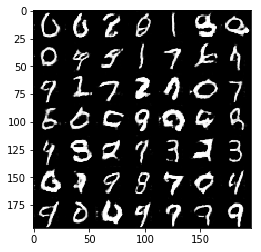

Epoch 2/4... Discriminator Loss: 1.1763... Generator Loss: 1.2107
Epoch 2/4... Discriminator Loss: 1.0140... Generator Loss: 0.5536
Epoch 2/4... Discriminator Loss: 0.8189... Generator Loss: 0.6468
Epoch 2/4... Discriminator Loss: 0.9516... Generator Loss: 1.2244
Epoch 2/4... Discriminator Loss: 1.0176... Generator Loss: 0.9574
Epoch 2/4... Discriminator Loss: 0.7582... Generator Loss: 1.1046
Epoch 2/4... Discriminator Loss: 1.5055... Generator Loss: 0.4895
Epoch 2/4... Discriminator Loss: 0.9196... Generator Loss: 0.7587
Epoch 2/4... Discriminator Loss: 1.3585... Generator Loss: 0.6729
Epoch 2/4... Discriminator Loss: 1.2897... Generator Loss: 1.0530
Epoch 2/4... Discriminator Loss: 0.9236... Generator Loss: 1.0520
Epoch 2/4... Discriminator Loss: 1.3674... Generator Loss: 0.9801
Epoch 2/4... Discriminator Loss: 0.9298... Generator Loss: 0.7908
Epoch 2/4... Discriminator Loss: 0.9636... Generator Loss: 1.0514
Epoch 2/4... Discriminator Loss: 0.9598... Generator Loss: 0.7764
Epoch 2/4.

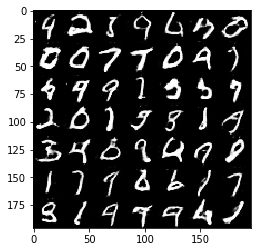

Epoch 2/4... Discriminator Loss: 1.8847... Generator Loss: 1.9271
Epoch 2/4... Discriminator Loss: 0.9203... Generator Loss: 0.4677
Epoch 2/4... Discriminator Loss: 1.2222... Generator Loss: 1.6131
Epoch 2/4... Discriminator Loss: 1.5445... Generator Loss: 0.9020
Epoch 2/4... Discriminator Loss: 1.2781... Generator Loss: 0.7535
Epoch 2/4... Discriminator Loss: 1.0408... Generator Loss: 1.0319
Epoch 2/4... Discriminator Loss: 1.0656... Generator Loss: 1.0304
Epoch 2/4... Discriminator Loss: 1.0547... Generator Loss: 2.1092
Epoch 2/4... Discriminator Loss: 0.9494... Generator Loss: 0.9636
Epoch 2/4... Discriminator Loss: 0.9029... Generator Loss: 1.8751
Epoch 2/4... Discriminator Loss: 1.1202... Generator Loss: 0.6497
Epoch 2/4... Discriminator Loss: 0.9284... Generator Loss: 1.5457
Epoch 2/4... Discriminator Loss: 1.5760... Generator Loss: 0.2971
Epoch 2/4... Discriminator Loss: 0.4890... Generator Loss: 1.4348
Epoch 2/4... Discriminator Loss: 0.7652... Generator Loss: 0.9070
Epoch 2/4.

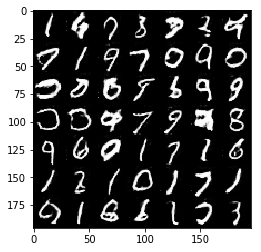

Epoch 2/4... Discriminator Loss: 0.9937... Generator Loss: 0.4789
Epoch 2/4... Discriminator Loss: 0.8285... Generator Loss: 1.0297
Epoch 2/4... Discriminator Loss: 0.8496... Generator Loss: 1.9562
Epoch 2/4... Discriminator Loss: 0.8369... Generator Loss: 2.2787
Epoch 2/4... Discriminator Loss: 1.0549... Generator Loss: 1.5341
Epoch 2/4... Discriminator Loss: 0.7469... Generator Loss: 1.2265
Epoch 2/4... Discriminator Loss: 0.9807... Generator Loss: 1.3104
Epoch 2/4... Discriminator Loss: 1.2040... Generator Loss: 1.6918
Epoch 2/4... Discriminator Loss: 0.8637... Generator Loss: 1.2355
Epoch 2/4... Discriminator Loss: 1.1896... Generator Loss: 0.6666
Epoch 3/4... Discriminator Loss: 0.8647... Generator Loss: 1.1847
Epoch 3/4... Discriminator Loss: 0.9459... Generator Loss: 1.7412
Epoch 3/4... Discriminator Loss: 0.6298... Generator Loss: 0.8864
Epoch 3/4... Discriminator Loss: 1.1333... Generator Loss: 0.8987
Epoch 3/4... Discriminator Loss: 0.5401... Generator Loss: 0.7488
Epoch 3/4.

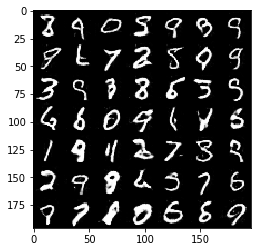

Epoch 3/4... Discriminator Loss: 0.7318... Generator Loss: 1.2095
Epoch 3/4... Discriminator Loss: 0.6436... Generator Loss: 1.2345
Epoch 3/4... Discriminator Loss: 0.7534... Generator Loss: 1.6392
Epoch 3/4... Discriminator Loss: 0.8044... Generator Loss: 1.4627
Epoch 3/4... Discriminator Loss: 0.8000... Generator Loss: 0.8609
Epoch 3/4... Discriminator Loss: 1.0799... Generator Loss: 1.2631
Epoch 3/4... Discriminator Loss: 1.1687... Generator Loss: 2.0514
Epoch 3/4... Discriminator Loss: 0.7614... Generator Loss: 1.5410
Epoch 3/4... Discriminator Loss: 0.7945... Generator Loss: 0.5604
Epoch 3/4... Discriminator Loss: 1.4592... Generator Loss: 0.8525
Epoch 3/4... Discriminator Loss: 0.3822... Generator Loss: 1.7466
Epoch 3/4... Discriminator Loss: 1.3715... Generator Loss: 0.5403
Epoch 3/4... Discriminator Loss: 0.6875... Generator Loss: 1.2994
Epoch 3/4... Discriminator Loss: 1.5759... Generator Loss: 3.3914
Epoch 3/4... Discriminator Loss: 0.7251... Generator Loss: 1.2228
Epoch 3/4.

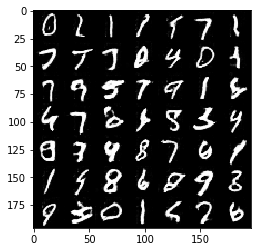

Epoch 3/4... Discriminator Loss: 0.6745... Generator Loss: 1.7303
Epoch 3/4... Discriminator Loss: 0.8838... Generator Loss: 1.3731
Epoch 3/4... Discriminator Loss: 0.7912... Generator Loss: 1.9751
Epoch 3/4... Discriminator Loss: 0.6403... Generator Loss: 1.9272
Epoch 3/4... Discriminator Loss: 1.7535... Generator Loss: 0.4950
Epoch 3/4... Discriminator Loss: 0.9051... Generator Loss: 1.2419
Epoch 3/4... Discriminator Loss: 0.7805... Generator Loss: 1.2685
Epoch 3/4... Discriminator Loss: 1.0722... Generator Loss: 0.9339
Epoch 3/4... Discriminator Loss: 0.7772... Generator Loss: 2.2065
Epoch 3/4... Discriminator Loss: 1.2086... Generator Loss: 0.8472
Epoch 3/4... Discriminator Loss: 0.7607... Generator Loss: 1.0482
Epoch 3/4... Discriminator Loss: 0.8836... Generator Loss: 1.3824
Epoch 3/4... Discriminator Loss: 0.9568... Generator Loss: 1.3729
Epoch 3/4... Discriminator Loss: 1.8683... Generator Loss: 0.6465
Epoch 3/4... Discriminator Loss: 1.1270... Generator Loss: 1.1891
Epoch 3/4.

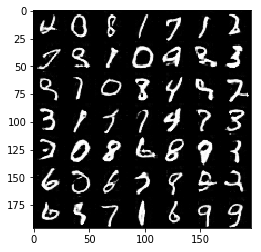

Epoch 3/4... Discriminator Loss: 1.6822... Generator Loss: 0.8724
Epoch 3/4... Discriminator Loss: 1.0003... Generator Loss: 1.2442
Epoch 3/4... Discriminator Loss: 1.7289... Generator Loss: 2.2085
Epoch 3/4... Discriminator Loss: 0.9208... Generator Loss: 0.7521
Epoch 3/4... Discriminator Loss: 1.9821... Generator Loss: 3.0005
Epoch 3/4... Discriminator Loss: 0.5685... Generator Loss: 1.8564
Epoch 3/4... Discriminator Loss: 0.6205... Generator Loss: 1.1632
Epoch 3/4... Discriminator Loss: 0.7862... Generator Loss: 2.1248
Epoch 3/4... Discriminator Loss: 0.9546... Generator Loss: 3.0450
Epoch 3/4... Discriminator Loss: 0.6998... Generator Loss: 2.0772
Epoch 3/4... Discriminator Loss: 1.3678... Generator Loss: 1.3259
Epoch 3/4... Discriminator Loss: 0.4370... Generator Loss: 0.8047
Epoch 3/4... Discriminator Loss: 2.2042... Generator Loss: 2.0432
Epoch 3/4... Discriminator Loss: 0.7839... Generator Loss: 1.3751
Epoch 3/4... Discriminator Loss: 1.0678... Generator Loss: 1.5636
Epoch 3/4.

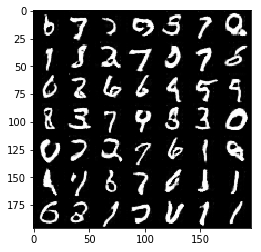

Epoch 3/4... Discriminator Loss: 0.6697... Generator Loss: 3.4769
Epoch 3/4... Discriminator Loss: 1.4282... Generator Loss: 1.9409
Epoch 3/4... Discriminator Loss: 0.5830... Generator Loss: 1.0548
Epoch 3/4... Discriminator Loss: 1.2114... Generator Loss: 0.9708
Epoch 3/4... Discriminator Loss: 0.8863... Generator Loss: 1.9131
Epoch 4/4... Discriminator Loss: 1.2875... Generator Loss: 1.3938
Epoch 4/4... Discriminator Loss: 1.1615... Generator Loss: 1.4245
Epoch 4/4... Discriminator Loss: 1.0754... Generator Loss: 2.1072
Epoch 4/4... Discriminator Loss: 0.8146... Generator Loss: 0.7769
Epoch 4/4... Discriminator Loss: 0.8191... Generator Loss: 1.0793
Epoch 4/4... Discriminator Loss: 0.8858... Generator Loss: 0.7300
Epoch 4/4... Discriminator Loss: 0.7883... Generator Loss: 2.5404
Epoch 4/4... Discriminator Loss: 1.3038... Generator Loss: 0.8617
Epoch 4/4... Discriminator Loss: 0.6636... Generator Loss: 1.0301
Epoch 4/4... Discriminator Loss: 1.3619... Generator Loss: 0.7203
Epoch 4/4.

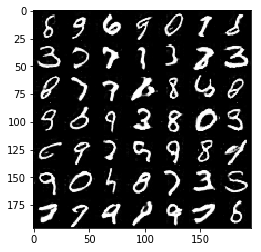

Epoch 4/4... Discriminator Loss: 0.6599... Generator Loss: 1.0039
Epoch 4/4... Discriminator Loss: 1.2557... Generator Loss: 0.5842
Epoch 4/4... Discriminator Loss: 1.0051... Generator Loss: 2.1023
Epoch 4/4... Discriminator Loss: 0.8245... Generator Loss: 1.2737
Epoch 4/4... Discriminator Loss: 1.2389... Generator Loss: 1.2888
Epoch 4/4... Discriminator Loss: 1.2533... Generator Loss: 1.6814
Epoch 4/4... Discriminator Loss: 0.4875... Generator Loss: 2.1184
Epoch 4/4... Discriminator Loss: 0.6577... Generator Loss: 0.7973
Epoch 4/4... Discriminator Loss: 0.2541... Generator Loss: 1.6690
Epoch 4/4... Discriminator Loss: 0.4957... Generator Loss: 1.6472
Epoch 4/4... Discriminator Loss: 2.1039... Generator Loss: 3.6909
Epoch 4/4... Discriminator Loss: 0.9073... Generator Loss: 1.2093
Epoch 4/4... Discriminator Loss: 0.7805... Generator Loss: 2.0924
Epoch 4/4... Discriminator Loss: 0.3019... Generator Loss: 1.0416
Epoch 4/4... Discriminator Loss: 0.3039... Generator Loss: 1.3750
Epoch 4/4.

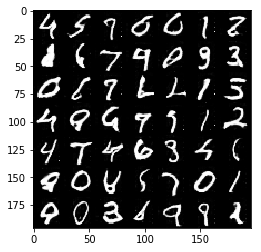

Epoch 4/4... Discriminator Loss: 0.6591... Generator Loss: 1.2483
Epoch 4/4... Discriminator Loss: 1.4350... Generator Loss: 1.9232
Epoch 4/4... Discriminator Loss: 0.7333... Generator Loss: 1.3511
Epoch 4/4... Discriminator Loss: 0.7027... Generator Loss: 2.2870
Epoch 4/4... Discriminator Loss: 0.5217... Generator Loss: 1.2943
Epoch 4/4... Discriminator Loss: 0.8615... Generator Loss: 1.5874
Epoch 4/4... Discriminator Loss: 0.5722... Generator Loss: 1.4940
Epoch 4/4... Discriminator Loss: 0.9080... Generator Loss: 1.8405
Epoch 4/4... Discriminator Loss: 0.8374... Generator Loss: 0.6917
Epoch 4/4... Discriminator Loss: 0.9128... Generator Loss: 1.3057
Epoch 4/4... Discriminator Loss: 1.7013... Generator Loss: 0.3180
Epoch 4/4... Discriminator Loss: 0.7631... Generator Loss: 1.3373
Epoch 4/4... Discriminator Loss: 1.4894... Generator Loss: 1.6977
Epoch 4/4... Discriminator Loss: 1.1450... Generator Loss: 0.6590
Epoch 4/4... Discriminator Loss: 0.8175... Generator Loss: 1.3530
Epoch 4/4.

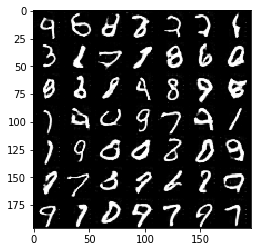

Epoch 4/4... Discriminator Loss: 0.9497... Generator Loss: 1.9289
Epoch 4/4... Discriminator Loss: 1.5228... Generator Loss: 3.0978
Epoch 4/4... Discriminator Loss: 1.5673... Generator Loss: 0.4499
Epoch 4/4... Discriminator Loss: 0.4991... Generator Loss: 1.3680
Epoch 4/4... Discriminator Loss: 0.7038... Generator Loss: 1.2216
Epoch 4/4... Discriminator Loss: 2.3470... Generator Loss: 2.9691
Epoch 4/4... Discriminator Loss: 0.9361... Generator Loss: 0.8562
Epoch 4/4... Discriminator Loss: 1.2854... Generator Loss: 1.2521
Epoch 4/4... Discriminator Loss: 0.8036... Generator Loss: 1.8728
Epoch 4/4... Discriminator Loss: 0.8863... Generator Loss: 0.9959
Epoch 4/4... Discriminator Loss: 0.3359... Generator Loss: 2.4306
Epoch 4/4... Discriminator Loss: 0.9271... Generator Loss: 1.6273
Epoch 4/4... Discriminator Loss: 0.5255... Generator Loss: 2.4800
Epoch 4/4... Discriminator Loss: 0.4141... Generator Loss: 2.1341
Epoch 4/4... Discriminator Loss: 1.1729... Generator Loss: 3.3593
Epoch 4/4.

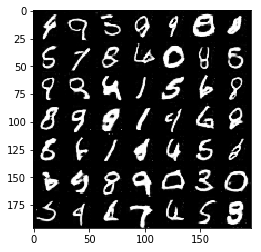

Final : Discriminator Loss: 0.3627... Generator Loss: 1.6909


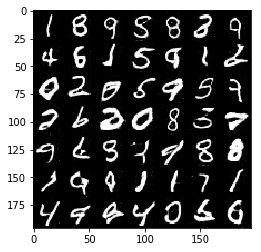

In [ ]:
batch_size = 16
z_dim = 100
learning_rate = 0.0006
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 4

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/8... Discriminator Loss: 2.4437... Generator Loss: 0.3135
Epoch 1/8... Discriminator Loss: 1.6759... Generator Loss: 1.3136
Epoch 1/8... Discriminator Loss: 0.7163... Generator Loss: 1.6982
Epoch 1/8... Discriminator Loss: 0.4768... Generator Loss: 1.5541
Epoch 1/8... Discriminator Loss: 0.6301... Generator Loss: 1.1334
Epoch 1/8... Discriminator Loss: 0.7772... Generator Loss: 1.2696
Epoch 1/8... Discriminator Loss: 0.2446... Generator Loss: 2.3542
Epoch 1/8... Discriminator Loss: 0.3060... Generator Loss: 3.0021
Epoch 1/8... Discriminator Loss: 0.3415... Generator Loss: 2.1344
Epoch 1/8... Discriminator Loss: 3.1170... Generator Loss: 0.6597
Epoch 1/8... Discriminator Loss: 1.4949... Generator Loss: 2.2485
Epoch 1/8... Discriminator Loss: 1.0383... Generator Loss: 0.9699
Epoch 1/8... Discriminator Loss: 1.1146... Generator Loss: 1.1539
Epoch 1/8... Discriminator Loss: 1.2343... Generator Loss: 1.4681
Epoch 1/8... Discriminator Loss: 1.2177... Generator Loss: 0.9751
Epoch 1/8.

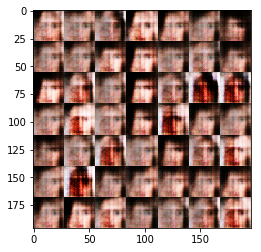

Epoch 1/8... Discriminator Loss: 1.3117... Generator Loss: 1.0278
Epoch 1/8... Discriminator Loss: 1.1087... Generator Loss: 1.0634
Epoch 1/8... Discriminator Loss: 1.1308... Generator Loss: 0.7584
Epoch 1/8... Discriminator Loss: 0.9699... Generator Loss: 1.5295
Epoch 1/8... Discriminator Loss: 1.8658... Generator Loss: 0.3096
Epoch 1/8... Discriminator Loss: 1.0710... Generator Loss: 0.9912
Epoch 1/8... Discriminator Loss: 1.3856... Generator Loss: 0.8313
Epoch 1/8... Discriminator Loss: 1.3425... Generator Loss: 0.6389
Epoch 1/8... Discriminator Loss: 1.2586... Generator Loss: 1.2608
Epoch 1/8... Discriminator Loss: 1.4534... Generator Loss: 1.0422
Epoch 1/8... Discriminator Loss: 1.0111... Generator Loss: 1.3670
Epoch 1/8... Discriminator Loss: 1.0025... Generator Loss: 1.4747
Epoch 1/8... Discriminator Loss: 1.0034... Generator Loss: 0.9054
Epoch 1/8... Discriminator Loss: 1.1255... Generator Loss: 0.6695
Epoch 1/8... Discriminator Loss: 1.0889... Generator Loss: 1.1730
Epoch 1/8.

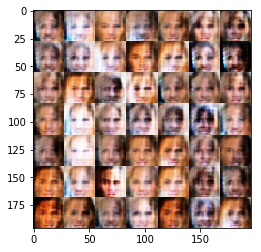

Epoch 1/8... Discriminator Loss: 1.2748... Generator Loss: 1.0259
Epoch 1/8... Discriminator Loss: 1.0929... Generator Loss: 0.7947
Epoch 1/8... Discriminator Loss: 1.3145... Generator Loss: 0.7853
Epoch 1/8... Discriminator Loss: 1.4102... Generator Loss: 0.8489
Epoch 1/8... Discriminator Loss: 1.2256... Generator Loss: 0.8767
Epoch 1/8... Discriminator Loss: 1.6128... Generator Loss: 0.8117
Epoch 1/8... Discriminator Loss: 0.7663... Generator Loss: 2.1428
Epoch 1/8... Discriminator Loss: 1.3209... Generator Loss: 0.4675
Epoch 1/8... Discriminator Loss: 1.0813... Generator Loss: 0.9549
Epoch 1/8... Discriminator Loss: 1.5196... Generator Loss: 0.9668
Epoch 1/8... Discriminator Loss: 1.1289... Generator Loss: 1.1098
Epoch 1/8... Discriminator Loss: 1.0141... Generator Loss: 1.1029
Epoch 1/8... Discriminator Loss: 1.1012... Generator Loss: 1.1829
Epoch 1/8... Discriminator Loss: 1.4292... Generator Loss: 1.1052
Epoch 1/8... Discriminator Loss: 0.9536... Generator Loss: 1.3484
Epoch 1/8.

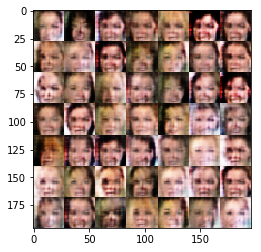

Epoch 1/8... Discriminator Loss: 1.0411... Generator Loss: 0.8304
Epoch 1/8... Discriminator Loss: 1.4810... Generator Loss: 0.7472
Epoch 1/8... Discriminator Loss: 0.6768... Generator Loss: 1.9735
Epoch 1/8... Discriminator Loss: 1.0116... Generator Loss: 1.1555
Epoch 1/8... Discriminator Loss: 1.0657... Generator Loss: 1.2760
Epoch 1/8... Discriminator Loss: 1.3003... Generator Loss: 0.8668
Epoch 1/8... Discriminator Loss: 1.3082... Generator Loss: 0.5729
Epoch 1/8... Discriminator Loss: 1.4087... Generator Loss: 1.1153
Epoch 1/8... Discriminator Loss: 1.0362... Generator Loss: 0.7346
Epoch 1/8... Discriminator Loss: 1.0404... Generator Loss: 1.1720
Epoch 1/8... Discriminator Loss: 1.2297... Generator Loss: 0.6584
Epoch 1/8... Discriminator Loss: 1.1322... Generator Loss: 0.9548
Epoch 1/8... Discriminator Loss: 0.8095... Generator Loss: 1.8429
Epoch 1/8... Discriminator Loss: 1.1781... Generator Loss: 0.7423
Epoch 1/8... Discriminator Loss: 1.1919... Generator Loss: 0.6786
Epoch 1/8.

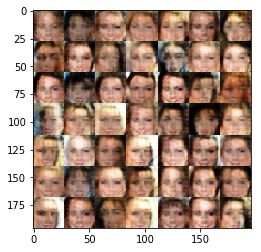

Epoch 1/8... Discriminator Loss: 1.1560... Generator Loss: 0.8246
Epoch 1/8... Discriminator Loss: 1.0341... Generator Loss: 0.8375
Epoch 1/8... Discriminator Loss: 0.9261... Generator Loss: 1.3647
Epoch 1/8... Discriminator Loss: 1.4314... Generator Loss: 0.4540
Epoch 1/8... Discriminator Loss: 1.0928... Generator Loss: 0.8938
Epoch 1/8... Discriminator Loss: 1.4947... Generator Loss: 1.1552
Epoch 1/8... Discriminator Loss: 1.4028... Generator Loss: 0.7981
Epoch 1/8... Discriminator Loss: 1.0439... Generator Loss: 0.8205
Epoch 1/8... Discriminator Loss: 1.6061... Generator Loss: 0.7376
Epoch 1/8... Discriminator Loss: 1.2139... Generator Loss: 0.8913
Epoch 1/8... Discriminator Loss: 1.1783... Generator Loss: 0.8008
Epoch 1/8... Discriminator Loss: 1.0107... Generator Loss: 0.9943
Epoch 1/8... Discriminator Loss: 1.2132... Generator Loss: 1.0934
Epoch 1/8... Discriminator Loss: 1.3452... Generator Loss: 0.7726
Epoch 1/8... Discriminator Loss: 1.1234... Generator Loss: 0.9095
Epoch 1/8.

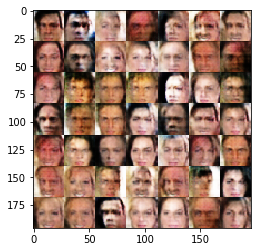

Epoch 1/8... Discriminator Loss: 1.2010... Generator Loss: 0.8165
Epoch 1/8... Discriminator Loss: 1.0546... Generator Loss: 0.9283
Epoch 1/8... Discriminator Loss: 1.3532... Generator Loss: 0.9344
Epoch 1/8... Discriminator Loss: 1.4963... Generator Loss: 0.7469
Epoch 1/8... Discriminator Loss: 1.3206... Generator Loss: 1.4881
Epoch 1/8... Discriminator Loss: 1.5337... Generator Loss: 0.3616
Epoch 1/8... Discriminator Loss: 1.4949... Generator Loss: 0.8763
Epoch 1/8... Discriminator Loss: 1.2189... Generator Loss: 0.8478
Epoch 1/8... Discriminator Loss: 0.9446... Generator Loss: 0.7326
Epoch 1/8... Discriminator Loss: 1.1155... Generator Loss: 1.0417
Epoch 1/8... Discriminator Loss: 0.6881... Generator Loss: 1.5190
Epoch 1/8... Discriminator Loss: 1.1877... Generator Loss: 0.8579
Epoch 1/8... Discriminator Loss: 1.2847... Generator Loss: 1.2001
Epoch 1/8... Discriminator Loss: 1.5438... Generator Loss: 0.6709
Epoch 1/8... Discriminator Loss: 1.2691... Generator Loss: 0.8260
Epoch 1/8.

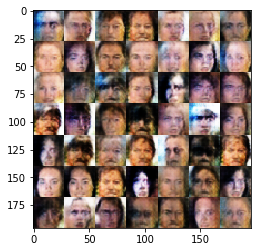

Epoch 1/8... Discriminator Loss: 1.1085... Generator Loss: 0.7472
Epoch 1/8... Discriminator Loss: 1.0215... Generator Loss: 1.2315
Epoch 1/8... Discriminator Loss: 0.9393... Generator Loss: 1.3371
Epoch 1/8... Discriminator Loss: 1.4939... Generator Loss: 0.7701
Epoch 1/8... Discriminator Loss: 1.3042... Generator Loss: 0.7287
Epoch 1/8... Discriminator Loss: 0.6788... Generator Loss: 1.4210
Epoch 1/8... Discriminator Loss: 1.3547... Generator Loss: 0.6983
Epoch 1/8... Discriminator Loss: 1.0775... Generator Loss: 1.1479
Epoch 1/8... Discriminator Loss: 1.2272... Generator Loss: 0.9458
Epoch 1/8... Discriminator Loss: 0.8524... Generator Loss: 1.4021
Epoch 1/8... Discriminator Loss: 1.4025... Generator Loss: 0.7260
Epoch 1/8... Discriminator Loss: 1.2797... Generator Loss: 0.7625
Epoch 1/8... Discriminator Loss: 1.3226... Generator Loss: 0.6864
Epoch 1/8... Discriminator Loss: 1.5169... Generator Loss: 0.6826
Epoch 1/8... Discriminator Loss: 1.3605... Generator Loss: 0.8545
Epoch 1/8.

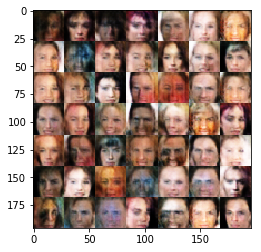

Epoch 1/8... Discriminator Loss: 1.0227... Generator Loss: 1.1084
Epoch 1/8... Discriminator Loss: 1.1452... Generator Loss: 0.7971
Epoch 1/8... Discriminator Loss: 1.3448... Generator Loss: 0.6998
Epoch 1/8... Discriminator Loss: 1.3136... Generator Loss: 0.6063
Epoch 1/8... Discriminator Loss: 1.3708... Generator Loss: 0.4857
Epoch 1/8... Discriminator Loss: 1.1604... Generator Loss: 0.8693
Epoch 1/8... Discriminator Loss: 1.3100... Generator Loss: 0.8625
Epoch 1/8... Discriminator Loss: 1.3852... Generator Loss: 0.8826
Epoch 1/8... Discriminator Loss: 1.1338... Generator Loss: 0.7952
Epoch 1/8... Discriminator Loss: 1.1972... Generator Loss: 0.6480
Epoch 1/8... Discriminator Loss: 0.9047... Generator Loss: 1.1394
Epoch 1/8... Discriminator Loss: 1.2240... Generator Loss: 0.8131
Epoch 1/8... Discriminator Loss: 1.3182... Generator Loss: 0.7988
Epoch 1/8... Discriminator Loss: 1.2280... Generator Loss: 0.7582
Epoch 1/8... Discriminator Loss: 1.5996... Generator Loss: 0.4531
Epoch 1/8.

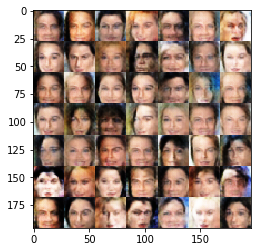

Epoch 1/8... Discriminator Loss: 1.3491... Generator Loss: 0.9831
Epoch 1/8... Discriminator Loss: 1.3575... Generator Loss: 0.6800
Epoch 1/8... Discriminator Loss: 1.5009... Generator Loss: 0.9298
Epoch 1/8... Discriminator Loss: 1.2066... Generator Loss: 0.7667
Epoch 1/8... Discriminator Loss: 1.0942... Generator Loss: 0.8158
Epoch 1/8... Discriminator Loss: 1.1251... Generator Loss: 0.6675
Epoch 1/8... Discriminator Loss: 1.1168... Generator Loss: 0.8912
Epoch 1/8... Discriminator Loss: 1.5024... Generator Loss: 0.6391
Epoch 1/8... Discriminator Loss: 1.2774... Generator Loss: 0.8657
Epoch 2/8... Discriminator Loss: 1.0234... Generator Loss: 1.1847
Epoch 2/8... Discriminator Loss: 1.2513... Generator Loss: 0.5995
Epoch 2/8... Discriminator Loss: 1.3117... Generator Loss: 0.7002
Epoch 2/8... Discriminator Loss: 1.3085... Generator Loss: 0.8165
Epoch 2/8... Discriminator Loss: 1.3463... Generator Loss: 0.8472
Epoch 2/8... Discriminator Loss: 0.9960... Generator Loss: 1.2234
Epoch 2/8.

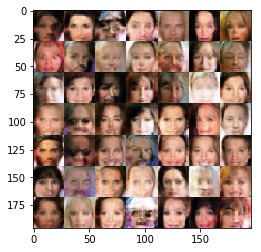

Epoch 2/8... Discriminator Loss: 1.3624... Generator Loss: 0.6891
Epoch 2/8... Discriminator Loss: 1.3007... Generator Loss: 0.8411
Epoch 2/8... Discriminator Loss: 0.9062... Generator Loss: 1.0709
Epoch 2/8... Discriminator Loss: 1.2378... Generator Loss: 0.9131
Epoch 2/8... Discriminator Loss: 1.4537... Generator Loss: 0.9272
Epoch 2/8... Discriminator Loss: 1.3319... Generator Loss: 0.7591
Epoch 2/8... Discriminator Loss: 1.4389... Generator Loss: 0.5897
Epoch 2/8... Discriminator Loss: 1.0624... Generator Loss: 0.8455
Epoch 2/8... Discriminator Loss: 1.4018... Generator Loss: 0.6653
Epoch 2/8... Discriminator Loss: 1.2882... Generator Loss: 0.7976
Epoch 2/8... Discriminator Loss: 1.2514... Generator Loss: 0.8595
Epoch 2/8... Discriminator Loss: 1.3208... Generator Loss: 0.8766
Epoch 2/8... Discriminator Loss: 1.3397... Generator Loss: 0.5910
Epoch 2/8... Discriminator Loss: 0.7137... Generator Loss: 2.0597
Epoch 2/8... Discriminator Loss: 1.3881... Generator Loss: 0.7910
Epoch 2/8.

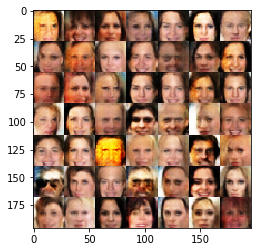

Epoch 2/8... Discriminator Loss: 1.2832... Generator Loss: 1.0613
Epoch 2/8... Discriminator Loss: 1.4224... Generator Loss: 0.7073
Epoch 2/8... Discriminator Loss: 1.2667... Generator Loss: 0.7786
Epoch 2/8... Discriminator Loss: 1.3903... Generator Loss: 0.9348
Epoch 2/8... Discriminator Loss: 1.1265... Generator Loss: 0.8071
Epoch 2/8... Discriminator Loss: 1.3199... Generator Loss: 0.8836
Epoch 2/8... Discriminator Loss: 0.9824... Generator Loss: 0.9554
Epoch 2/8... Discriminator Loss: 1.5180... Generator Loss: 0.6304
Epoch 2/8... Discriminator Loss: 1.1450... Generator Loss: 1.0217
Epoch 2/8... Discriminator Loss: 1.2224... Generator Loss: 0.9622
Epoch 2/8... Discriminator Loss: 1.2467... Generator Loss: 0.9731
Epoch 2/8... Discriminator Loss: 1.2782... Generator Loss: 0.7529
Epoch 2/8... Discriminator Loss: 1.3017... Generator Loss: 0.5760
Epoch 2/8... Discriminator Loss: 1.3709... Generator Loss: 0.8032
Epoch 2/8... Discriminator Loss: 1.3332... Generator Loss: 0.8155
Epoch 2/8.

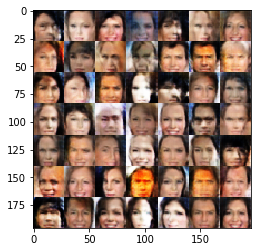

Epoch 2/8... Discriminator Loss: 1.6168... Generator Loss: 0.5731
Epoch 2/8... Discriminator Loss: 1.0773... Generator Loss: 0.7056
Epoch 2/8... Discriminator Loss: 1.2124... Generator Loss: 0.8356
Epoch 2/8... Discriminator Loss: 1.2289... Generator Loss: 0.8019
Epoch 2/8... Discriminator Loss: 1.3253... Generator Loss: 1.0554
Epoch 2/8... Discriminator Loss: 1.1647... Generator Loss: 0.7516
Epoch 2/8... Discriminator Loss: 1.4435... Generator Loss: 0.7647
Epoch 2/8... Discriminator Loss: 1.1704... Generator Loss: 1.7534
Epoch 2/8... Discriminator Loss: 1.2473... Generator Loss: 0.9005
Epoch 2/8... Discriminator Loss: 1.3251... Generator Loss: 0.7436
Epoch 2/8... Discriminator Loss: 1.4229... Generator Loss: 0.7466
Epoch 2/8... Discriminator Loss: 1.2869... Generator Loss: 0.9839
Epoch 2/8... Discriminator Loss: 1.1361... Generator Loss: 0.7433
Epoch 2/8... Discriminator Loss: 1.3035... Generator Loss: 0.6915
Epoch 2/8... Discriminator Loss: 1.3556... Generator Loss: 0.5866
Epoch 2/8.

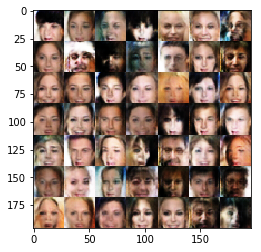

Epoch 2/8... Discriminator Loss: 1.2333... Generator Loss: 0.8279
Epoch 2/8... Discriminator Loss: 1.0884... Generator Loss: 0.7417
Epoch 2/8... Discriminator Loss: 1.2515... Generator Loss: 1.1019
Epoch 2/8... Discriminator Loss: 1.5845... Generator Loss: 0.4175
Epoch 2/8... Discriminator Loss: 1.0597... Generator Loss: 0.7642
Epoch 2/8... Discriminator Loss: 1.2277... Generator Loss: 0.6815
Epoch 2/8... Discriminator Loss: 1.2938... Generator Loss: 0.9308
Epoch 2/8... Discriminator Loss: 0.6608... Generator Loss: 2.6302
Epoch 2/8... Discriminator Loss: 1.3070... Generator Loss: 1.0859
Epoch 2/8... Discriminator Loss: 1.2132... Generator Loss: 0.7848
Epoch 2/8... Discriminator Loss: 1.3550... Generator Loss: 0.7625
Epoch 2/8... Discriminator Loss: 1.2636... Generator Loss: 0.7930
Epoch 2/8... Discriminator Loss: 1.2035... Generator Loss: 0.8140
Epoch 2/8... Discriminator Loss: 1.2680... Generator Loss: 0.8999
Epoch 2/8... Discriminator Loss: 1.2341... Generator Loss: 0.8404
Epoch 2/8.

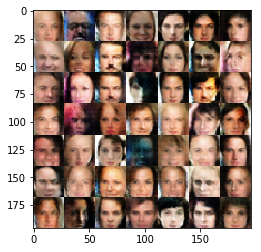

Epoch 2/8... Discriminator Loss: 1.3080... Generator Loss: 1.0817
Epoch 2/8... Discriminator Loss: 1.2562... Generator Loss: 1.4095
Epoch 2/8... Discriminator Loss: 0.8548... Generator Loss: 2.2847
Epoch 2/8... Discriminator Loss: 1.2245... Generator Loss: 1.0117
Epoch 2/8... Discriminator Loss: 1.0591... Generator Loss: 1.1763
Epoch 2/8... Discriminator Loss: 1.4328... Generator Loss: 0.8838
Epoch 2/8... Discriminator Loss: 1.1958... Generator Loss: 0.7787
Epoch 2/8... Discriminator Loss: 1.3805... Generator Loss: 0.7993
Epoch 2/8... Discriminator Loss: 1.1826... Generator Loss: 0.7438
Epoch 2/8... Discriminator Loss: 1.3394... Generator Loss: 0.5755
Epoch 2/8... Discriminator Loss: 1.2277... Generator Loss: 0.4965
Epoch 2/8... Discriminator Loss: 1.3459... Generator Loss: 0.7292
Epoch 2/8... Discriminator Loss: 1.3090... Generator Loss: 0.7148
Epoch 2/8... Discriminator Loss: 1.2145... Generator Loss: 0.8567
Epoch 2/8... Discriminator Loss: 1.0492... Generator Loss: 0.8647
Epoch 2/8.

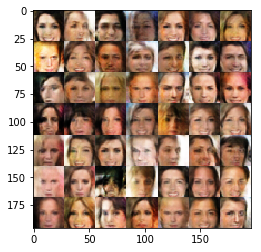

Epoch 2/8... Discriminator Loss: 1.3517... Generator Loss: 0.7188
Epoch 2/8... Discriminator Loss: 0.8060... Generator Loss: 1.5693
Epoch 2/8... Discriminator Loss: 1.1882... Generator Loss: 0.8221
Epoch 2/8... Discriminator Loss: 1.1856... Generator Loss: 1.0819
Epoch 2/8... Discriminator Loss: 1.1159... Generator Loss: 0.8782
Epoch 2/8... Discriminator Loss: 1.1228... Generator Loss: 0.5746
Epoch 2/8... Discriminator Loss: 1.3148... Generator Loss: 0.8640
Epoch 2/8... Discriminator Loss: 0.9743... Generator Loss: 1.2462
Epoch 2/8... Discriminator Loss: 0.7257... Generator Loss: 2.9528
Epoch 2/8... Discriminator Loss: 1.3346... Generator Loss: 0.9469
Epoch 2/8... Discriminator Loss: 1.3708... Generator Loss: 0.6634
Epoch 2/8... Discriminator Loss: 1.3118... Generator Loss: 0.9455
Epoch 2/8... Discriminator Loss: 1.2127... Generator Loss: 0.9789
Epoch 2/8... Discriminator Loss: 1.2501... Generator Loss: 0.9301
Epoch 2/8... Discriminator Loss: 1.2792... Generator Loss: 0.7014
Epoch 2/8.

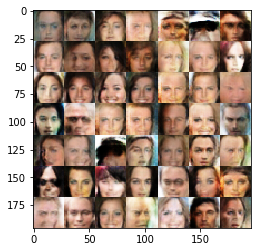

Epoch 2/8... Discriminator Loss: 1.3387... Generator Loss: 0.8651
Epoch 2/8... Discriminator Loss: 1.2022... Generator Loss: 0.9222
Epoch 2/8... Discriminator Loss: 1.3373... Generator Loss: 0.9920
Epoch 2/8... Discriminator Loss: 1.1561... Generator Loss: 0.6958
Epoch 2/8... Discriminator Loss: 1.1409... Generator Loss: 0.9569
Epoch 2/8... Discriminator Loss: 1.2811... Generator Loss: 0.7301
Epoch 2/8... Discriminator Loss: 1.2549... Generator Loss: 0.6363
Epoch 2/8... Discriminator Loss: 1.2536... Generator Loss: 0.8957
Epoch 2/8... Discriminator Loss: 1.2489... Generator Loss: 0.7522
Epoch 2/8... Discriminator Loss: 1.2776... Generator Loss: 0.8169
Epoch 2/8... Discriminator Loss: 1.4784... Generator Loss: 0.5900
Epoch 2/8... Discriminator Loss: 1.3675... Generator Loss: 0.7313
Epoch 2/8... Discriminator Loss: 1.0415... Generator Loss: 0.7679
Epoch 2/8... Discriminator Loss: 1.2191... Generator Loss: 0.7479
Epoch 2/8... Discriminator Loss: 1.2085... Generator Loss: 0.7068
Epoch 2/8.

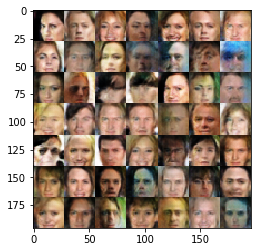

Epoch 2/8... Discriminator Loss: 0.6556... Generator Loss: 1.6705
Epoch 2/8... Discriminator Loss: 1.2979... Generator Loss: 0.9943
Epoch 2/8... Discriminator Loss: 1.6782... Generator Loss: 0.4456
Epoch 2/8... Discriminator Loss: 1.2805... Generator Loss: 1.1965
Epoch 2/8... Discriminator Loss: 1.3150... Generator Loss: 0.6420
Epoch 2/8... Discriminator Loss: 1.4305... Generator Loss: 0.7272
Epoch 2/8... Discriminator Loss: 0.8059... Generator Loss: 1.2429
Epoch 2/8... Discriminator Loss: 1.4123... Generator Loss: 0.8469
Epoch 2/8... Discriminator Loss: 1.1997... Generator Loss: 0.7505
Epoch 2/8... Discriminator Loss: 0.6087... Generator Loss: 3.2688
Epoch 2/8... Discriminator Loss: 1.4955... Generator Loss: 0.4627
Epoch 2/8... Discriminator Loss: 1.2408... Generator Loss: 0.7998
Epoch 2/8... Discriminator Loss: 1.4184... Generator Loss: 0.9762
Epoch 2/8... Discriminator Loss: 1.2004... Generator Loss: 0.9137
Epoch 2/8... Discriminator Loss: 1.2645... Generator Loss: 0.6731
Epoch 2/8.

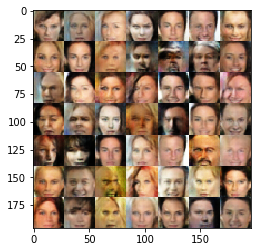

Epoch 3/8... Discriminator Loss: 1.3975... Generator Loss: 0.8692
Epoch 3/8... Discriminator Loss: 1.3004... Generator Loss: 0.8682
Epoch 3/8... Discriminator Loss: 1.0330... Generator Loss: 0.9442
Epoch 3/8... Discriminator Loss: 1.4892... Generator Loss: 0.4736
Epoch 3/8... Discriminator Loss: 1.1867... Generator Loss: 0.7507
Epoch 3/8... Discriminator Loss: 1.1819... Generator Loss: 0.8492
Epoch 3/8... Discriminator Loss: 1.2954... Generator Loss: 1.6991
Epoch 3/8... Discriminator Loss: 1.2729... Generator Loss: 0.8123
Epoch 3/8... Discriminator Loss: 1.4313... Generator Loss: 0.7194
Epoch 3/8... Discriminator Loss: 1.3155... Generator Loss: 0.8336
Epoch 3/8... Discriminator Loss: 1.0884... Generator Loss: 0.7882
Epoch 3/8... Discriminator Loss: 1.5309... Generator Loss: 0.3266
Epoch 3/8... Discriminator Loss: 1.3398... Generator Loss: 0.8470
Epoch 3/8... Discriminator Loss: 1.1662... Generator Loss: 0.7993
Epoch 3/8... Discriminator Loss: 1.0424... Generator Loss: 1.1518
Epoch 3/8.

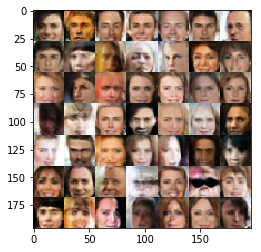

Epoch 3/8... Discriminator Loss: 1.4549... Generator Loss: 0.6200
Epoch 3/8... Discriminator Loss: 1.0985... Generator Loss: 0.9913
Epoch 3/8... Discriminator Loss: 1.3425... Generator Loss: 0.9243
Epoch 3/8... Discriminator Loss: 1.3826... Generator Loss: 0.7971
Epoch 3/8... Discriminator Loss: 1.3061... Generator Loss: 0.8082
Epoch 3/8... Discriminator Loss: 1.4183... Generator Loss: 0.6643
Epoch 3/8... Discriminator Loss: 1.2027... Generator Loss: 0.7808
Epoch 3/8... Discriminator Loss: 1.3095... Generator Loss: 0.8186
Epoch 3/8... Discriminator Loss: 1.0497... Generator Loss: 0.9460
Epoch 3/8... Discriminator Loss: 1.3073... Generator Loss: 0.8719
Epoch 3/8... Discriminator Loss: 1.2989... Generator Loss: 0.7768
Epoch 3/8... Discriminator Loss: 1.3709... Generator Loss: 0.8644
Epoch 3/8... Discriminator Loss: 1.3414... Generator Loss: 0.9534
Epoch 3/8... Discriminator Loss: 1.2894... Generator Loss: 0.7705
Epoch 3/8... Discriminator Loss: 0.7506... Generator Loss: 1.7888
Epoch 3/8.

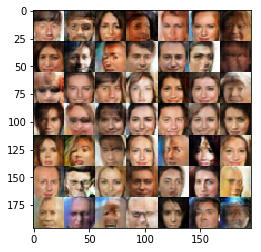

Epoch 3/8... Discriminator Loss: 1.3438... Generator Loss: 0.4251
Epoch 3/8... Discriminator Loss: 1.2135... Generator Loss: 1.0275
Epoch 3/8... Discriminator Loss: 1.2555... Generator Loss: 0.4736
Epoch 3/8... Discriminator Loss: 1.3449... Generator Loss: 0.9553
Epoch 3/8... Discriminator Loss: 1.1582... Generator Loss: 0.7054
Epoch 3/8... Discriminator Loss: 1.2618... Generator Loss: 0.9006
Epoch 3/8... Discriminator Loss: 1.3908... Generator Loss: 0.7710
Epoch 3/8... Discriminator Loss: 1.2015... Generator Loss: 0.5751
Epoch 3/8... Discriminator Loss: 1.1395... Generator Loss: 0.6660
Epoch 3/8... Discriminator Loss: 1.2890... Generator Loss: 0.7589
Epoch 3/8... Discriminator Loss: 0.8586... Generator Loss: 1.1914
Epoch 3/8... Discriminator Loss: 0.9661... Generator Loss: 0.9785
Epoch 3/8... Discriminator Loss: 1.3207... Generator Loss: 0.7520
Epoch 3/8... Discriminator Loss: 1.1034... Generator Loss: 0.9511
Epoch 3/8... Discriminator Loss: 1.6091... Generator Loss: 0.7144
Epoch 3/8.

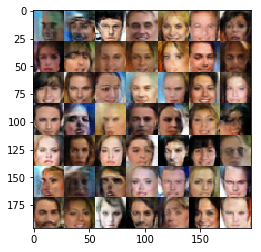

Epoch 3/8... Discriminator Loss: 1.1546... Generator Loss: 0.8533
Epoch 3/8... Discriminator Loss: 1.7845... Generator Loss: 0.9591
Epoch 3/8... Discriminator Loss: 1.2429... Generator Loss: 0.9955
Epoch 3/8... Discriminator Loss: 1.2824... Generator Loss: 0.8111
Epoch 3/8... Discriminator Loss: 1.4639... Generator Loss: 0.8497
Epoch 3/8... Discriminator Loss: 1.1609... Generator Loss: 0.7718
Epoch 3/8... Discriminator Loss: 1.2806... Generator Loss: 0.8427
Epoch 3/8... Discriminator Loss: 1.1821... Generator Loss: 0.8713
Epoch 3/8... Discriminator Loss: 1.3340... Generator Loss: 0.9151
Epoch 3/8... Discriminator Loss: 1.1315... Generator Loss: 0.9578
Epoch 3/8... Discriminator Loss: 1.3232... Generator Loss: 1.0448
Epoch 3/8... Discriminator Loss: 0.8495... Generator Loss: 1.2711
Epoch 3/8... Discriminator Loss: 1.2557... Generator Loss: 0.9380
Epoch 3/8... Discriminator Loss: 1.2048... Generator Loss: 0.7956
Epoch 3/8... Discriminator Loss: 1.2194... Generator Loss: 1.1430
Epoch 3/8.

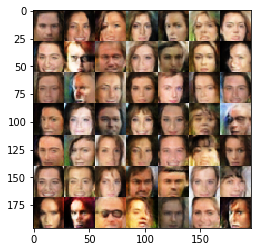

Epoch 3/8... Discriminator Loss: 1.2045... Generator Loss: 0.8493
Epoch 3/8... Discriminator Loss: 1.2850... Generator Loss: 0.9437
Epoch 3/8... Discriminator Loss: 1.4492... Generator Loss: 0.7260
Epoch 3/8... Discriminator Loss: 1.1795... Generator Loss: 1.0183
Epoch 3/8... Discriminator Loss: 1.2164... Generator Loss: 0.7859
Epoch 3/8... Discriminator Loss: 1.2081... Generator Loss: 0.7825
Epoch 3/8... Discriminator Loss: 1.1504... Generator Loss: 0.8587
Epoch 3/8... Discriminator Loss: 1.2777... Generator Loss: 0.7383
Epoch 3/8... Discriminator Loss: 1.4659... Generator Loss: 0.7888
Epoch 3/8... Discriminator Loss: 1.3341... Generator Loss: 0.7805
Epoch 3/8... Discriminator Loss: 1.2315... Generator Loss: 0.8665
Epoch 3/8... Discriminator Loss: 1.3256... Generator Loss: 0.8431
Epoch 3/8... Discriminator Loss: 1.3656... Generator Loss: 0.7272
Epoch 3/8... Discriminator Loss: 1.3144... Generator Loss: 0.8208
Epoch 3/8... Discriminator Loss: 1.1411... Generator Loss: 0.9176
Epoch 3/8.

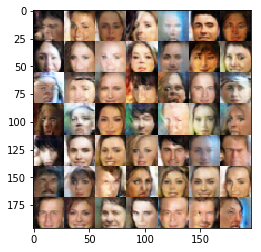

Epoch 3/8... Discriminator Loss: 1.3704... Generator Loss: 0.6207
Epoch 3/8... Discriminator Loss: 1.3400... Generator Loss: 1.0666
Epoch 3/8... Discriminator Loss: 1.2043... Generator Loss: 0.7692
Epoch 3/8... Discriminator Loss: 1.2408... Generator Loss: 0.7862
Epoch 3/8... Discriminator Loss: 1.2794... Generator Loss: 0.7075
Epoch 3/8... Discriminator Loss: 1.2985... Generator Loss: 0.7823
Epoch 3/8... Discriminator Loss: 1.2699... Generator Loss: 0.8403
Epoch 3/8... Discriminator Loss: 1.2051... Generator Loss: 1.0324
Epoch 3/8... Discriminator Loss: 1.3981... Generator Loss: 0.8157
Epoch 3/8... Discriminator Loss: 1.1677... Generator Loss: 0.7614
Epoch 3/8... Discriminator Loss: 1.0829... Generator Loss: 0.9291
Epoch 3/8... Discriminator Loss: 0.9703... Generator Loss: 1.5077
Epoch 3/8... Discriminator Loss: 1.5275... Generator Loss: 0.6737
Epoch 3/8... Discriminator Loss: 1.1756... Generator Loss: 0.9345
Epoch 3/8... Discriminator Loss: 1.1403... Generator Loss: 0.9242
Epoch 3/8.

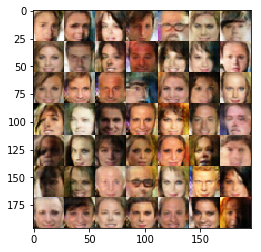

Epoch 3/8... Discriminator Loss: 1.2879... Generator Loss: 0.7866
Epoch 3/8... Discriminator Loss: 1.2615... Generator Loss: 0.6934
Epoch 3/8... Discriminator Loss: 1.3833... Generator Loss: 0.8956
Epoch 3/8... Discriminator Loss: 1.1971... Generator Loss: 0.8536
Epoch 3/8... Discriminator Loss: 1.2871... Generator Loss: 0.8686
Epoch 3/8... Discriminator Loss: 1.0901... Generator Loss: 1.0295
Epoch 3/8... Discriminator Loss: 1.3545... Generator Loss: 0.6924
Epoch 3/8... Discriminator Loss: 1.2367... Generator Loss: 0.7912
Epoch 3/8... Discriminator Loss: 1.3105... Generator Loss: 0.9216
Epoch 3/8... Discriminator Loss: 1.1085... Generator Loss: 0.7864
Epoch 3/8... Discriminator Loss: 1.0441... Generator Loss: 0.9692
Epoch 3/8... Discriminator Loss: 1.3262... Generator Loss: 0.7956
Epoch 3/8... Discriminator Loss: 1.1483... Generator Loss: 0.5662
Epoch 3/8... Discriminator Loss: 1.2503... Generator Loss: 0.5867
Epoch 3/8... Discriminator Loss: 1.1013... Generator Loss: 0.8543
Epoch 3/8.

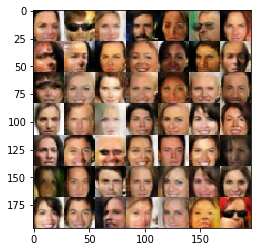

Epoch 3/8... Discriminator Loss: 1.1760... Generator Loss: 0.9164
Epoch 3/8... Discriminator Loss: 1.0335... Generator Loss: 0.9438
Epoch 3/8... Discriminator Loss: 0.9791... Generator Loss: 0.9294
Epoch 3/8... Discriminator Loss: 1.1507... Generator Loss: 0.6214
Epoch 3/8... Discriminator Loss: 1.2276... Generator Loss: 0.8303
Epoch 3/8... Discriminator Loss: 1.0710... Generator Loss: 0.6733
Epoch 3/8... Discriminator Loss: 1.1476... Generator Loss: 1.1115
Epoch 3/8... Discriminator Loss: 0.4082... Generator Loss: 3.9354
Epoch 3/8... Discriminator Loss: 1.4515... Generator Loss: 0.8226
Epoch 3/8... Discriminator Loss: 1.2180... Generator Loss: 1.2038
Epoch 3/8... Discriminator Loss: 1.0130... Generator Loss: 0.8989
Epoch 3/8... Discriminator Loss: 0.9601... Generator Loss: 1.0436
Epoch 3/8... Discriminator Loss: 0.9758... Generator Loss: 0.7420
Epoch 3/8... Discriminator Loss: 1.4972... Generator Loss: 0.5657
Epoch 3/8... Discriminator Loss: 1.2645... Generator Loss: 0.8365
Epoch 3/8.

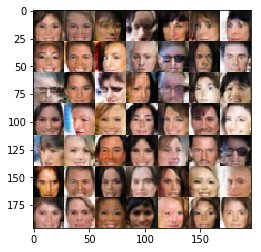

Epoch 3/8... Discriminator Loss: 1.1802... Generator Loss: 0.9276
Epoch 3/8... Discriminator Loss: 0.9966... Generator Loss: 0.9113
Epoch 3/8... Discriminator Loss: 1.1281... Generator Loss: 0.9085
Epoch 3/8... Discriminator Loss: 0.9835... Generator Loss: 0.6651
Epoch 3/8... Discriminator Loss: 1.2101... Generator Loss: 0.8713
Epoch 3/8... Discriminator Loss: 1.0984... Generator Loss: 1.1993
Epoch 3/8... Discriminator Loss: 1.0352... Generator Loss: 0.9743
Epoch 4/8... Discriminator Loss: 1.2603... Generator Loss: 0.7115
Epoch 4/8... Discriminator Loss: 1.1942... Generator Loss: 0.9793
Epoch 4/8... Discriminator Loss: 1.2139... Generator Loss: 0.6633
Epoch 4/8... Discriminator Loss: 1.1343... Generator Loss: 1.0364
Epoch 4/8... Discriminator Loss: 1.1717... Generator Loss: 0.8936
Epoch 4/8... Discriminator Loss: 0.6039... Generator Loss: 1.7462
Epoch 4/8... Discriminator Loss: 1.1815... Generator Loss: 0.6153
Epoch 4/8... Discriminator Loss: 1.3120... Generator Loss: 0.6633
Epoch 4/8.

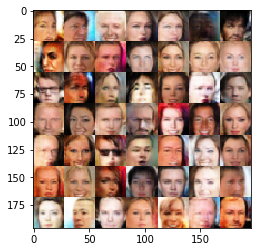

Epoch 4/8... Discriminator Loss: 1.2539... Generator Loss: 0.7767
Epoch 4/8... Discriminator Loss: 1.3521... Generator Loss: 0.8906
Epoch 4/8... Discriminator Loss: 0.6346... Generator Loss: 2.3326
Epoch 4/8... Discriminator Loss: 1.0978... Generator Loss: 0.8976
Epoch 4/8... Discriminator Loss: 1.2129... Generator Loss: 0.7511
Epoch 4/8... Discriminator Loss: 1.1997... Generator Loss: 1.0089
Epoch 4/8... Discriminator Loss: 1.3167... Generator Loss: 0.7392
Epoch 4/8... Discriminator Loss: 1.2037... Generator Loss: 0.8201
Epoch 4/8... Discriminator Loss: 1.5649... Generator Loss: 0.4091
Epoch 4/8... Discriminator Loss: 1.2560... Generator Loss: 0.6530
Epoch 4/8... Discriminator Loss: 1.2732... Generator Loss: 0.5257
Epoch 4/8... Discriminator Loss: 1.4335... Generator Loss: 0.9132
Epoch 4/8... Discriminator Loss: 1.1243... Generator Loss: 0.9956
Epoch 4/8... Discriminator Loss: 1.1417... Generator Loss: 0.9047
Epoch 4/8... Discriminator Loss: 1.0769... Generator Loss: 0.5777
Epoch 4/8.

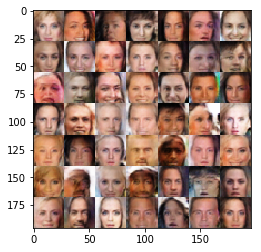

Epoch 4/8... Discriminator Loss: 1.1583... Generator Loss: 1.0058
Epoch 4/8... Discriminator Loss: 1.3775... Generator Loss: 0.6943
Epoch 4/8... Discriminator Loss: 1.2133... Generator Loss: 0.8795
Epoch 4/8... Discriminator Loss: 1.2273... Generator Loss: 0.7722
Epoch 4/8... Discriminator Loss: 1.3186... Generator Loss: 0.6323
Epoch 4/8... Discriminator Loss: 1.3093... Generator Loss: 0.5519
Epoch 4/8... Discriminator Loss: 1.3252... Generator Loss: 0.7766
Epoch 4/8... Discriminator Loss: 1.1086... Generator Loss: 0.7335
Epoch 4/8... Discriminator Loss: 1.2132... Generator Loss: 0.7957
Epoch 4/8... Discriminator Loss: 0.7690... Generator Loss: 1.5921
Epoch 4/8... Discriminator Loss: 1.0821... Generator Loss: 0.9541
Epoch 4/8... Discriminator Loss: 1.1402... Generator Loss: 0.8685
Epoch 4/8... Discriminator Loss: 1.3245... Generator Loss: 0.7086
Epoch 4/8... Discriminator Loss: 1.0942... Generator Loss: 0.9456
Epoch 4/8... Discriminator Loss: 1.4384... Generator Loss: 0.7693
Epoch 4/8.

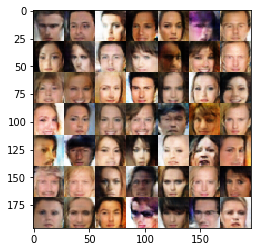

Epoch 4/8... Discriminator Loss: 1.0692... Generator Loss: 0.9216
Epoch 4/8... Discriminator Loss: 1.0378... Generator Loss: 0.8842
Epoch 4/8... Discriminator Loss: 1.5587... Generator Loss: 0.7249
Epoch 4/8... Discriminator Loss: 0.7427... Generator Loss: 2.9083
Epoch 4/8... Discriminator Loss: 1.4558... Generator Loss: 0.7148
Epoch 4/8... Discriminator Loss: 1.1053... Generator Loss: 1.1656
Epoch 4/8... Discriminator Loss: 1.1435... Generator Loss: 0.8159
Epoch 4/8... Discriminator Loss: 1.4285... Generator Loss: 0.7638
Epoch 4/8... Discriminator Loss: 1.4089... Generator Loss: 0.5521
Epoch 4/8... Discriminator Loss: 1.3629... Generator Loss: 0.8218
Epoch 4/8... Discriminator Loss: 0.9918... Generator Loss: 0.7690
Epoch 4/8... Discriminator Loss: 1.0332... Generator Loss: 1.1706
Epoch 4/8... Discriminator Loss: 1.4504... Generator Loss: 1.0071
Epoch 4/8... Discriminator Loss: 1.3251... Generator Loss: 0.6618
Epoch 4/8... Discriminator Loss: 1.1509... Generator Loss: 0.7026
Epoch 4/8.

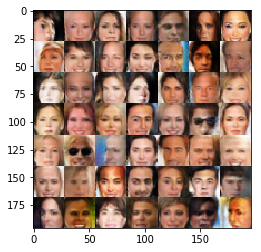

Epoch 4/8... Discriminator Loss: 0.9974... Generator Loss: 1.2107
Epoch 4/8... Discriminator Loss: 0.5557... Generator Loss: 2.4749
Epoch 4/8... Discriminator Loss: 0.5242... Generator Loss: 2.8481
Epoch 4/8... Discriminator Loss: 0.6911... Generator Loss: 1.1828
Epoch 4/8... Discriminator Loss: 1.0879... Generator Loss: 1.2849
Epoch 4/8... Discriminator Loss: 1.2404... Generator Loss: 0.7878
Epoch 4/8... Discriminator Loss: 1.2265... Generator Loss: 0.8973
Epoch 4/8... Discriminator Loss: 1.2986... Generator Loss: 0.4785
Epoch 4/8... Discriminator Loss: 1.2293... Generator Loss: 0.6876
Epoch 4/8... Discriminator Loss: 1.2806... Generator Loss: 0.7450
Epoch 4/8... Discriminator Loss: 1.1530... Generator Loss: 1.0300
Epoch 4/8... Discriminator Loss: 1.0662... Generator Loss: 1.0780
Epoch 4/8... Discriminator Loss: 1.1732... Generator Loss: 1.0384
Epoch 4/8... Discriminator Loss: 1.4512... Generator Loss: 0.7484
Epoch 4/8... Discriminator Loss: 1.0552... Generator Loss: 0.8348
Epoch 4/8.

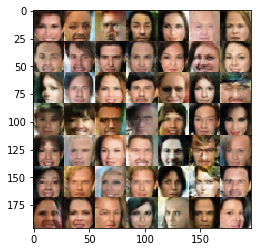

Epoch 4/8... Discriminator Loss: 1.2094... Generator Loss: 1.2110
Epoch 4/8... Discriminator Loss: 0.6999... Generator Loss: 3.2518
Epoch 4/8... Discriminator Loss: 1.4744... Generator Loss: 0.7214
Epoch 4/8... Discriminator Loss: 1.1112... Generator Loss: 0.8651
Epoch 4/8... Discriminator Loss: 0.7647... Generator Loss: 0.8459
Epoch 4/8... Discriminator Loss: 1.1884... Generator Loss: 0.8430
Epoch 4/8... Discriminator Loss: 0.9989... Generator Loss: 1.3469
Epoch 4/8... Discriminator Loss: 1.1104... Generator Loss: 0.7358
Epoch 4/8... Discriminator Loss: 1.2591... Generator Loss: 0.8339
Epoch 4/8... Discriminator Loss: 1.5376... Generator Loss: 0.8039
Epoch 4/8... Discriminator Loss: 0.8563... Generator Loss: 1.0570
Epoch 4/8... Discriminator Loss: 1.3196... Generator Loss: 0.6328
Epoch 4/8... Discriminator Loss: 1.1952... Generator Loss: 0.8289
Epoch 4/8... Discriminator Loss: 1.1537... Generator Loss: 0.8712
Epoch 4/8... Discriminator Loss: 1.3509... Generator Loss: 0.9114
Epoch 4/8.

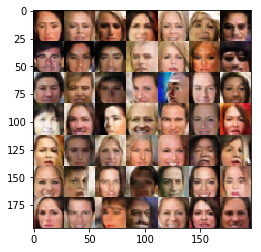

Epoch 4/8... Discriminator Loss: 1.1662... Generator Loss: 0.8383
Epoch 4/8... Discriminator Loss: 1.1062... Generator Loss: 0.5323
Epoch 4/8... Discriminator Loss: 1.3010... Generator Loss: 0.8137
Epoch 4/8... Discriminator Loss: 1.2060... Generator Loss: 0.8455
Epoch 4/8... Discriminator Loss: 1.2977... Generator Loss: 1.5365
Epoch 4/8... Discriminator Loss: 1.4186... Generator Loss: 0.8631
Epoch 4/8... Discriminator Loss: 0.4739... Generator Loss: 4.8124
Epoch 4/8... Discriminator Loss: 1.0721... Generator Loss: 0.8229
Epoch 4/8... Discriminator Loss: 1.0827... Generator Loss: 0.8587
Epoch 4/8... Discriminator Loss: 1.4946... Generator Loss: 1.0899
Epoch 4/8... Discriminator Loss: 1.1335... Generator Loss: 0.8753
Epoch 4/8... Discriminator Loss: 1.0652... Generator Loss: 1.0148
Epoch 4/8... Discriminator Loss: 1.2116... Generator Loss: 0.7718
Epoch 4/8... Discriminator Loss: 1.4037... Generator Loss: 0.6028
Epoch 4/8... Discriminator Loss: 1.2086... Generator Loss: 0.7827
Epoch 4/8.

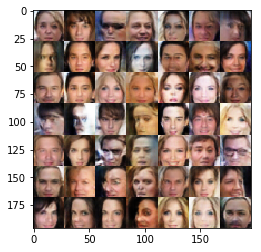

Epoch 4/8... Discriminator Loss: 1.1422... Generator Loss: 1.0278
Epoch 4/8... Discriminator Loss: 1.3102... Generator Loss: 1.9817
Epoch 4/8... Discriminator Loss: 1.4909... Generator Loss: 0.6565
Epoch 4/8... Discriminator Loss: 1.2792... Generator Loss: 1.1378
Epoch 4/8... Discriminator Loss: 1.0854... Generator Loss: 0.8136
Epoch 4/8... Discriminator Loss: 1.4290... Generator Loss: 0.8292
Epoch 4/8... Discriminator Loss: 1.1505... Generator Loss: 1.3332
Epoch 4/8... Discriminator Loss: 1.1170... Generator Loss: 1.2789
Epoch 4/8... Discriminator Loss: 1.2800... Generator Loss: 0.7719
Epoch 4/8... Discriminator Loss: 1.3106... Generator Loss: 1.1543
Epoch 4/8... Discriminator Loss: 0.7041... Generator Loss: 1.9352
Epoch 4/8... Discriminator Loss: 1.0617... Generator Loss: 0.8738
Epoch 4/8... Discriminator Loss: 1.2222... Generator Loss: 1.0638
Epoch 4/8... Discriminator Loss: 1.0543... Generator Loss: 1.1479
Epoch 4/8... Discriminator Loss: 1.3838... Generator Loss: 0.5702
Epoch 4/8.

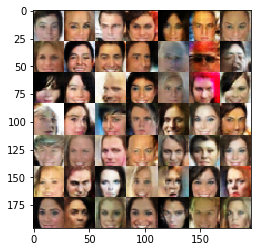

Epoch 4/8... Discriminator Loss: 1.1154... Generator Loss: 0.5799
Epoch 4/8... Discriminator Loss: 1.2138... Generator Loss: 1.3561
Epoch 4/8... Discriminator Loss: 1.3937... Generator Loss: 0.7001
Epoch 4/8... Discriminator Loss: 0.9190... Generator Loss: 1.6919
Epoch 4/8... Discriminator Loss: 0.9846... Generator Loss: 1.0546
Epoch 4/8... Discriminator Loss: 1.0564... Generator Loss: 1.1140
Epoch 4/8... Discriminator Loss: 1.4356... Generator Loss: 0.8907
Epoch 4/8... Discriminator Loss: 1.1979... Generator Loss: 0.8094
Epoch 4/8... Discriminator Loss: 0.5915... Generator Loss: 2.5329
Epoch 4/8... Discriminator Loss: 0.5115... Generator Loss: 3.3732
Epoch 4/8... Discriminator Loss: 1.2341... Generator Loss: 0.9844
Epoch 4/8... Discriminator Loss: 1.7750... Generator Loss: 1.8645
Epoch 4/8... Discriminator Loss: 0.8570... Generator Loss: 0.9796
Epoch 4/8... Discriminator Loss: 0.8473... Generator Loss: 0.7465
Epoch 4/8... Discriminator Loss: 1.3407... Generator Loss: 0.7801
Epoch 4/8.

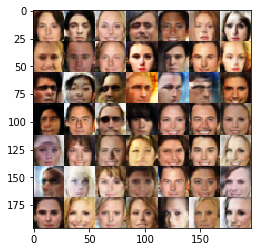

Epoch 5/8... Discriminator Loss: 1.4092... Generator Loss: 1.0268
Epoch 5/8... Discriminator Loss: 1.2715... Generator Loss: 0.9898
Epoch 5/8... Discriminator Loss: 1.3654... Generator Loss: 0.8561
Epoch 5/8... Discriminator Loss: 1.1975... Generator Loss: 0.7736
Epoch 5/8... Discriminator Loss: 1.1504... Generator Loss: 0.9337
Epoch 5/8... Discriminator Loss: 1.2829... Generator Loss: 0.5056
Epoch 5/8... Discriminator Loss: 1.2805... Generator Loss: 0.8880
Epoch 5/8... Discriminator Loss: 1.4339... Generator Loss: 0.9342
Epoch 5/8... Discriminator Loss: 1.2539... Generator Loss: 0.8474
Epoch 5/8... Discriminator Loss: 1.0001... Generator Loss: 1.2080
Epoch 5/8... Discriminator Loss: 1.2779... Generator Loss: 0.8521
Epoch 5/8... Discriminator Loss: 1.6320... Generator Loss: 0.2828
Epoch 5/8... Discriminator Loss: 1.1958... Generator Loss: 0.7755
Epoch 5/8... Discriminator Loss: 0.4325... Generator Loss: 3.1201
Epoch 5/8... Discriminator Loss: 1.0924... Generator Loss: 0.8132
Epoch 5/8.

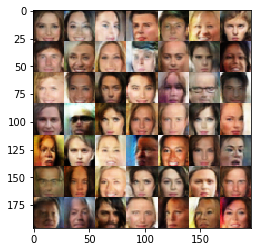

Epoch 5/8... Discriminator Loss: 1.0102... Generator Loss: 1.1800
Epoch 5/8... Discriminator Loss: 1.2072... Generator Loss: 0.8916
Epoch 5/8... Discriminator Loss: 0.9702... Generator Loss: 0.8033
Epoch 5/8... Discriminator Loss: 1.1674... Generator Loss: 0.6406
Epoch 5/8... Discriminator Loss: 1.4229... Generator Loss: 0.8386
Epoch 5/8... Discriminator Loss: 1.1758... Generator Loss: 1.0974
Epoch 5/8... Discriminator Loss: 0.7536... Generator Loss: 0.8598
Epoch 5/8... Discriminator Loss: 0.9291... Generator Loss: 1.1633
Epoch 5/8... Discriminator Loss: 0.9319... Generator Loss: 0.7139
Epoch 5/8... Discriminator Loss: 1.2354... Generator Loss: 1.0148
Epoch 5/8... Discriminator Loss: 1.3311... Generator Loss: 0.7544
Epoch 5/8... Discriminator Loss: 0.7149... Generator Loss: 4.0775
Epoch 5/8... Discriminator Loss: 1.0708... Generator Loss: 1.0851
Epoch 5/8... Discriminator Loss: 0.9396... Generator Loss: 0.7228
Epoch 5/8... Discriminator Loss: 1.3172... Generator Loss: 0.9093
Epoch 5/8.

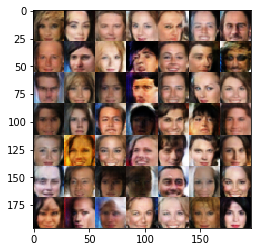

Epoch 5/8... Discriminator Loss: 0.9975... Generator Loss: 0.9575
Epoch 5/8... Discriminator Loss: 1.1883... Generator Loss: 0.8710
Epoch 5/8... Discriminator Loss: 1.0453... Generator Loss: 1.0172
Epoch 5/8... Discriminator Loss: 1.0156... Generator Loss: 1.0293
Epoch 5/8... Discriminator Loss: 1.2102... Generator Loss: 0.8314
Epoch 5/8... Discriminator Loss: 1.3905... Generator Loss: 0.8711
Epoch 5/8... Discriminator Loss: 1.4979... Generator Loss: 0.6869
Epoch 5/8... Discriminator Loss: 1.0773... Generator Loss: 1.0151
Epoch 5/8... Discriminator Loss: 0.6370... Generator Loss: 2.1772
Epoch 5/8... Discriminator Loss: 1.4187... Generator Loss: 2.2664
Epoch 5/8... Discriminator Loss: 0.5746... Generator Loss: 3.7215
Epoch 5/8... Discriminator Loss: 1.1620... Generator Loss: 0.8744
Epoch 5/8... Discriminator Loss: 0.8627... Generator Loss: 1.1085
Epoch 5/8... Discriminator Loss: 1.1831... Generator Loss: 0.6605
Epoch 5/8... Discriminator Loss: 0.4797... Generator Loss: 1.6886
Epoch 5/8.

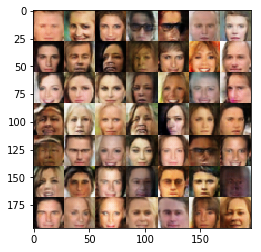

Epoch 5/8... Discriminator Loss: 0.7269... Generator Loss: 1.4881
Epoch 5/8... Discriminator Loss: 1.0968... Generator Loss: 0.9046
Epoch 5/8... Discriminator Loss: 1.1984... Generator Loss: 0.5579
Epoch 5/8... Discriminator Loss: 1.0202... Generator Loss: 1.0234
Epoch 5/8... Discriminator Loss: 0.8871... Generator Loss: 1.4120
Epoch 5/8... Discriminator Loss: 1.2453... Generator Loss: 0.7322
Epoch 5/8... Discriminator Loss: 1.4247... Generator Loss: 1.1449
Epoch 5/8... Discriminator Loss: 1.0098... Generator Loss: 0.9038
Epoch 5/8... Discriminator Loss: 1.2152... Generator Loss: 0.7652
Epoch 5/8... Discriminator Loss: 1.1864... Generator Loss: 1.0245
Epoch 5/8... Discriminator Loss: 1.2831... Generator Loss: 0.9186
Epoch 5/8... Discriminator Loss: 0.4678... Generator Loss: 2.2785
Epoch 5/8... Discriminator Loss: 0.9803... Generator Loss: 1.0312
Epoch 5/8... Discriminator Loss: 1.1142... Generator Loss: 0.7196
Epoch 5/8... Discriminator Loss: 1.2785... Generator Loss: 0.7607
Epoch 5/8.

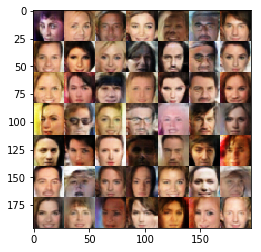

Epoch 5/8... Discriminator Loss: 0.9525... Generator Loss: 0.8433
Epoch 5/8... Discriminator Loss: 1.0892... Generator Loss: 0.9752
Epoch 5/8... Discriminator Loss: 1.3470... Generator Loss: 0.7751
Epoch 5/8... Discriminator Loss: 0.4207... Generator Loss: 3.2917
Epoch 5/8... Discriminator Loss: 1.4389... Generator Loss: 0.8291
Epoch 5/8... Discriminator Loss: 1.0675... Generator Loss: 1.2207
Epoch 5/8... Discriminator Loss: 1.0811... Generator Loss: 0.8264
Epoch 5/8... Discriminator Loss: 1.1641... Generator Loss: 1.2176
Epoch 5/8... Discriminator Loss: 1.7138... Generator Loss: 1.7003
Epoch 5/8... Discriminator Loss: 1.1418... Generator Loss: 0.6788
Epoch 5/8... Discriminator Loss: 0.9675... Generator Loss: 0.7144
Epoch 5/8... Discriminator Loss: 0.3382... Generator Loss: 2.8128
Epoch 5/8... Discriminator Loss: 1.2689... Generator Loss: 0.7683
Epoch 5/8... Discriminator Loss: 1.1882... Generator Loss: 0.6344
Epoch 5/8... Discriminator Loss: 1.2345... Generator Loss: 0.8205
Epoch 5/8.

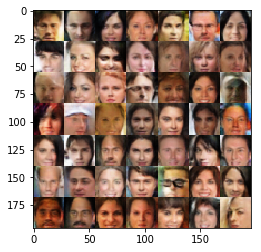

Epoch 5/8... Discriminator Loss: 0.9435... Generator Loss: 0.9326
Epoch 5/8... Discriminator Loss: 1.3730... Generator Loss: 0.9436
Epoch 5/8... Discriminator Loss: 1.0046... Generator Loss: 0.6019
Epoch 5/8... Discriminator Loss: 0.9431... Generator Loss: 1.7226
Epoch 5/8... Discriminator Loss: 1.5765... Generator Loss: 1.5065
Epoch 5/8... Discriminator Loss: 1.3589... Generator Loss: 1.1167
Epoch 5/8... Discriminator Loss: 0.9737... Generator Loss: 1.5935
Epoch 5/8... Discriminator Loss: 1.2263... Generator Loss: 0.9299
Epoch 5/8... Discriminator Loss: 1.0345... Generator Loss: 1.0412
Epoch 5/8... Discriminator Loss: 0.8101... Generator Loss: 0.8639
Epoch 5/8... Discriminator Loss: 0.9943... Generator Loss: 0.8669
Epoch 5/8... Discriminator Loss: 1.3163... Generator Loss: 0.7750
Epoch 5/8... Discriminator Loss: 0.5968... Generator Loss: 1.1566
Epoch 5/8... Discriminator Loss: 1.0144... Generator Loss: 1.6550
Epoch 5/8... Discriminator Loss: 1.2999... Generator Loss: 1.0574
Epoch 5/8.

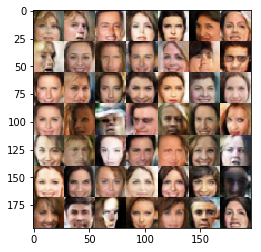

Epoch 5/8... Discriminator Loss: 0.3895... Generator Loss: 3.7136
Epoch 5/8... Discriminator Loss: 1.3617... Generator Loss: 1.1053
Epoch 5/8... Discriminator Loss: 1.0680... Generator Loss: 0.8645
Epoch 5/8... Discriminator Loss: 1.4847... Generator Loss: 1.4571
Epoch 5/8... Discriminator Loss: 1.0533... Generator Loss: 0.9133
Epoch 5/8... Discriminator Loss: 1.2296... Generator Loss: 1.4530
Epoch 5/8... Discriminator Loss: 1.0306... Generator Loss: 0.4572
Epoch 5/8... Discriminator Loss: 1.3634... Generator Loss: 1.1632
Epoch 5/8... Discriminator Loss: 1.1862... Generator Loss: 0.9342
Epoch 5/8... Discriminator Loss: 0.7538... Generator Loss: 4.5584
Epoch 5/8... Discriminator Loss: 1.0019... Generator Loss: 0.8848
Epoch 5/8... Discriminator Loss: 1.4621... Generator Loss: 0.5872
Epoch 5/8... Discriminator Loss: 1.3074... Generator Loss: 0.9037
Epoch 5/8... Discriminator Loss: 1.1869... Generator Loss: 1.1939
Epoch 5/8... Discriminator Loss: 0.7642... Generator Loss: 1.0305
Epoch 5/8.

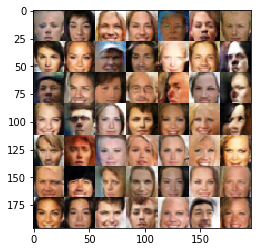

Epoch 5/8... Discriminator Loss: 0.6563... Generator Loss: 1.4438
Epoch 5/8... Discriminator Loss: 1.0247... Generator Loss: 0.8832
Epoch 5/8... Discriminator Loss: 0.9592... Generator Loss: 0.8402
Epoch 5/8... Discriminator Loss: 1.0699... Generator Loss: 0.7232
Epoch 5/8... Discriminator Loss: 0.9481... Generator Loss: 1.1947
Epoch 5/8... Discriminator Loss: 0.9121... Generator Loss: 1.2511
Epoch 5/8... Discriminator Loss: 0.4484... Generator Loss: 3.1566
Epoch 5/8... Discriminator Loss: 1.1898... Generator Loss: 1.0007
Epoch 5/8... Discriminator Loss: 0.9845... Generator Loss: 0.7460
Epoch 5/8... Discriminator Loss: 0.9961... Generator Loss: 1.1635
Epoch 5/8... Discriminator Loss: 1.4383... Generator Loss: 0.4841
Epoch 5/8... Discriminator Loss: 1.4052... Generator Loss: 0.7217
Epoch 5/8... Discriminator Loss: 1.0583... Generator Loss: 0.9403
Epoch 5/8... Discriminator Loss: 1.0398... Generator Loss: 0.9592
Epoch 5/8... Discriminator Loss: 1.0813... Generator Loss: 0.7482
Epoch 5/8.

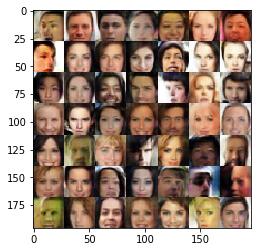

Epoch 5/8... Discriminator Loss: 1.2783... Generator Loss: 0.9551
Epoch 5/8... Discriminator Loss: 1.3054... Generator Loss: 0.8355
Epoch 5/8... Discriminator Loss: 1.1605... Generator Loss: 1.4536
Epoch 5/8... Discriminator Loss: 1.1841... Generator Loss: 1.2677
Epoch 5/8... Discriminator Loss: 0.9517... Generator Loss: 1.0461
Epoch 6/8... Discriminator Loss: 0.3178... Generator Loss: 5.2862
Epoch 6/8... Discriminator Loss: 1.4078... Generator Loss: 0.8460
Epoch 6/8... Discriminator Loss: 1.2658... Generator Loss: 0.9853
Epoch 6/8... Discriminator Loss: 0.8701... Generator Loss: 1.3102
Epoch 6/8... Discriminator Loss: 1.3319... Generator Loss: 0.8547
Epoch 6/8... Discriminator Loss: 1.2979... Generator Loss: 1.2932
Epoch 6/8... Discriminator Loss: 0.9845... Generator Loss: 1.3651
Epoch 6/8... Discriminator Loss: 1.3255... Generator Loss: 0.9548
Epoch 6/8... Discriminator Loss: 0.8660... Generator Loss: 1.0132
Epoch 6/8... Discriminator Loss: 1.2087... Generator Loss: 0.6445
Epoch 6/8.

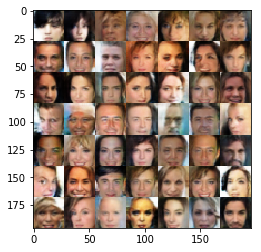

Epoch 6/8... Discriminator Loss: 1.1085... Generator Loss: 1.1957
Epoch 6/8... Discriminator Loss: 1.2543... Generator Loss: 0.9182
Epoch 6/8... Discriminator Loss: 0.8901... Generator Loss: 1.0234
Epoch 6/8... Discriminator Loss: 0.6424... Generator Loss: 1.2855
Epoch 6/8... Discriminator Loss: 1.1131... Generator Loss: 1.2107
Epoch 6/8... Discriminator Loss: 0.5592... Generator Loss: 0.7477
Epoch 6/8... Discriminator Loss: 1.3335... Generator Loss: 0.7547
Epoch 6/8... Discriminator Loss: 1.0579... Generator Loss: 1.0609
Epoch 6/8... Discriminator Loss: 1.3063... Generator Loss: 0.7853
Epoch 6/8... Discriminator Loss: 0.8435... Generator Loss: 1.1957
Epoch 6/8... Discriminator Loss: 1.4197... Generator Loss: 1.0604
Epoch 6/8... Discriminator Loss: 1.2509... Generator Loss: 0.8124
Epoch 6/8... Discriminator Loss: 0.3866... Generator Loss: 4.8346
Epoch 6/8... Discriminator Loss: 1.3766... Generator Loss: 0.9648
Epoch 6/8... Discriminator Loss: 0.7090... Generator Loss: 1.4981
Epoch 6/8.

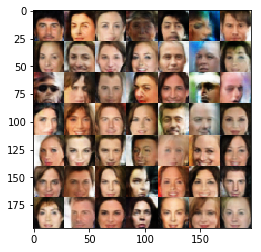

Epoch 6/8... Discriminator Loss: 1.4550... Generator Loss: 1.0833
Epoch 6/8... Discriminator Loss: 1.0351... Generator Loss: 1.5398
Epoch 6/8... Discriminator Loss: 0.9891... Generator Loss: 0.6972
Epoch 6/8... Discriminator Loss: 0.9153... Generator Loss: 1.1379
Epoch 6/8... Discriminator Loss: 0.9876... Generator Loss: 1.3279
Epoch 6/8... Discriminator Loss: 1.3005... Generator Loss: 0.6523
Epoch 6/8... Discriminator Loss: 0.8979... Generator Loss: 1.1115
Epoch 6/8... Discriminator Loss: 1.1022... Generator Loss: 1.2825
Epoch 6/8... Discriminator Loss: 0.8768... Generator Loss: 1.0512
Epoch 6/8... Discriminator Loss: 1.0864... Generator Loss: 1.0146
Epoch 6/8... Discriminator Loss: 0.7152... Generator Loss: 1.0780
Epoch 6/8... Discriminator Loss: 1.2409... Generator Loss: 0.8145
Epoch 6/8... Discriminator Loss: 1.1534... Generator Loss: 0.9115
Epoch 6/8... Discriminator Loss: 0.4530... Generator Loss: 1.9471
Epoch 6/8... Discriminator Loss: 1.3781... Generator Loss: 1.1374
Epoch 6/8.

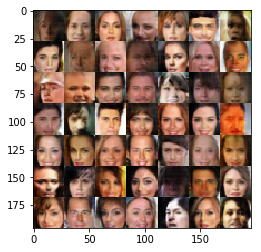

Epoch 6/8... Discriminator Loss: 0.7013... Generator Loss: 1.6856
Epoch 6/8... Discriminator Loss: 1.4142... Generator Loss: 1.0219
Epoch 6/8... Discriminator Loss: 0.8603... Generator Loss: 1.1333
Epoch 6/8... Discriminator Loss: 1.3995... Generator Loss: 1.0296
Epoch 6/8... Discriminator Loss: 1.1294... Generator Loss: 0.7951
Epoch 6/8... Discriminator Loss: 1.1529... Generator Loss: 1.0694
Epoch 6/8... Discriminator Loss: 0.9493... Generator Loss: 1.2676
Epoch 6/8... Discriminator Loss: 1.3077... Generator Loss: 0.7814
Epoch 6/8... Discriminator Loss: 0.9758... Generator Loss: 0.7505
Epoch 6/8... Discriminator Loss: 1.2232... Generator Loss: 0.7110
Epoch 6/8... Discriminator Loss: 0.6806... Generator Loss: 1.9578
Epoch 6/8... Discriminator Loss: 0.5409... Generator Loss: 1.3635
Epoch 6/8... Discriminator Loss: 1.4088... Generator Loss: 1.1937
Epoch 6/8... Discriminator Loss: 1.4265... Generator Loss: 1.0047
Epoch 6/8... Discriminator Loss: 1.0985... Generator Loss: 0.8426
Epoch 6/8.

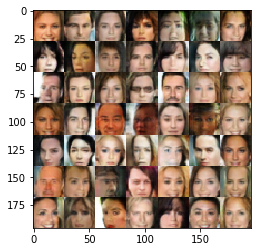

Epoch 6/8... Discriminator Loss: 0.5747... Generator Loss: 2.1714
Epoch 6/8... Discriminator Loss: 0.9164... Generator Loss: 0.8185
Epoch 6/8... Discriminator Loss: 1.3380... Generator Loss: 2.1883
Epoch 6/8... Discriminator Loss: 1.4506... Generator Loss: 0.8037
Epoch 6/8... Discriminator Loss: 0.9815... Generator Loss: 1.2114
Epoch 6/8... Discriminator Loss: 0.9508... Generator Loss: 1.1930
Epoch 6/8... Discriminator Loss: 1.4271... Generator Loss: 0.7483
Epoch 6/8... Discriminator Loss: 0.8201... Generator Loss: 1.6036
Epoch 6/8... Discriminator Loss: 1.1588... Generator Loss: 0.7848
Epoch 6/8... Discriminator Loss: 1.0969... Generator Loss: 0.9574
Epoch 6/8... Discriminator Loss: 0.9475... Generator Loss: 1.1656
Epoch 6/8... Discriminator Loss: 0.9217... Generator Loss: 1.0616
Epoch 6/8... Discriminator Loss: 0.8626... Generator Loss: 0.9716
Epoch 6/8... Discriminator Loss: 1.4621... Generator Loss: 1.0648
Epoch 6/8... Discriminator Loss: 0.8128... Generator Loss: 0.9041
Epoch 6/8.

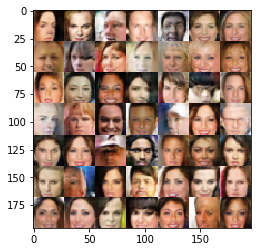

Epoch 6/8... Discriminator Loss: 0.4212... Generator Loss: 4.9358
Epoch 6/8... Discriminator Loss: 1.0329... Generator Loss: 1.0788
Epoch 6/8... Discriminator Loss: 0.9281... Generator Loss: 0.7768
Epoch 6/8... Discriminator Loss: 1.5663... Generator Loss: 0.8603
Epoch 6/8... Discriminator Loss: 0.8293... Generator Loss: 2.0377
Epoch 6/8... Discriminator Loss: 0.9730... Generator Loss: 1.5787
Epoch 6/8... Discriminator Loss: 0.3803... Generator Loss: 3.4868
Epoch 6/8... Discriminator Loss: 1.1162... Generator Loss: 0.5248
Epoch 6/8... Discriminator Loss: 1.1926... Generator Loss: 1.0151
Epoch 6/8... Discriminator Loss: 0.8966... Generator Loss: 1.7408
Epoch 6/8... Discriminator Loss: 1.0267... Generator Loss: 0.5413
Epoch 6/8... Discriminator Loss: 0.8881... Generator Loss: 1.8458
Epoch 6/8... Discriminator Loss: 1.4533... Generator Loss: 1.3737
Epoch 6/8... Discriminator Loss: 1.3116... Generator Loss: 1.0106
Epoch 6/8... Discriminator Loss: 1.5088... Generator Loss: 2.7161
Epoch 6/8.

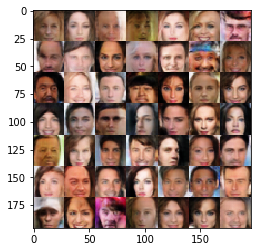

Epoch 6/8... Discriminator Loss: 1.2964... Generator Loss: 0.7605
Epoch 6/8... Discriminator Loss: 1.0749... Generator Loss: 1.2834
Epoch 6/8... Discriminator Loss: 1.0529... Generator Loss: 0.8182
Epoch 6/8... Discriminator Loss: 1.2159... Generator Loss: 1.9282
Epoch 6/8... Discriminator Loss: 0.8199... Generator Loss: 1.5440
Epoch 6/8... Discriminator Loss: 1.0033... Generator Loss: 0.9993
Epoch 6/8... Discriminator Loss: 0.8882... Generator Loss: 1.2071
Epoch 6/8... Discriminator Loss: 0.5145... Generator Loss: 2.5216
Epoch 6/8... Discriminator Loss: 0.8141... Generator Loss: 1.6371
Epoch 6/8... Discriminator Loss: 1.3899... Generator Loss: 0.8061
Epoch 6/8... Discriminator Loss: 1.4156... Generator Loss: 0.8524
Epoch 6/8... Discriminator Loss: 1.1268... Generator Loss: 0.6812
Epoch 6/8... Discriminator Loss: 1.2156... Generator Loss: 0.7447
Epoch 6/8... Discriminator Loss: 0.8882... Generator Loss: 0.9807
Epoch 6/8... Discriminator Loss: 0.9199... Generator Loss: 0.8358
Epoch 6/8.

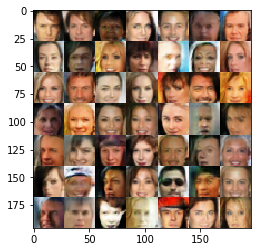

Epoch 6/8... Discriminator Loss: 0.9044... Generator Loss: 0.7159
Epoch 6/8... Discriminator Loss: 1.0512... Generator Loss: 0.7781
Epoch 6/8... Discriminator Loss: 1.1223... Generator Loss: 0.9978
Epoch 6/8... Discriminator Loss: 0.7383... Generator Loss: 0.8433
Epoch 6/8... Discriminator Loss: 1.2851... Generator Loss: 0.7688
Epoch 6/8... Discriminator Loss: 1.1230... Generator Loss: 1.0175
Epoch 6/8... Discriminator Loss: 0.8273... Generator Loss: 1.3431
Epoch 6/8... Discriminator Loss: 1.6579... Generator Loss: 3.2325
Epoch 6/8... Discriminator Loss: 1.3779... Generator Loss: 0.6508
Epoch 6/8... Discriminator Loss: 0.9454... Generator Loss: 0.9809
Epoch 6/8... Discriminator Loss: 0.9860... Generator Loss: 1.2594
Epoch 6/8... Discriminator Loss: 1.2219... Generator Loss: 0.5614
Epoch 6/8... Discriminator Loss: 1.4947... Generator Loss: 0.7400
Epoch 6/8... Discriminator Loss: 1.2813... Generator Loss: 0.7647
Epoch 6/8... Discriminator Loss: 1.0839... Generator Loss: 0.7535
Epoch 6/8.

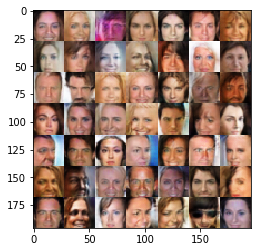

Epoch 6/8... Discriminator Loss: 0.9966... Generator Loss: 1.0340
Epoch 6/8... Discriminator Loss: 0.7820... Generator Loss: 0.8947
Epoch 6/8... Discriminator Loss: 0.9803... Generator Loss: 1.5999
Epoch 6/8... Discriminator Loss: 1.0049... Generator Loss: 1.1068
Epoch 6/8... Discriminator Loss: 1.0697... Generator Loss: 1.5258
Epoch 6/8... Discriminator Loss: 1.0522... Generator Loss: 1.3240
Epoch 6/8... Discriminator Loss: 0.9963... Generator Loss: 1.4849
Epoch 6/8... Discriminator Loss: 1.1797... Generator Loss: 3.8869
Epoch 6/8... Discriminator Loss: 0.9981... Generator Loss: 0.8104
Epoch 6/8... Discriminator Loss: 1.3120... Generator Loss: 1.1526
Epoch 6/8... Discriminator Loss: 0.7977... Generator Loss: 2.1723
Epoch 6/8... Discriminator Loss: 1.0824... Generator Loss: 0.8709
Epoch 6/8... Discriminator Loss: 0.7360... Generator Loss: 2.7261
Epoch 7/8... Discriminator Loss: 0.7306... Generator Loss: 1.7549
Epoch 7/8... Discriminator Loss: 0.5833... Generator Loss: 1.3474
Epoch 7/8.

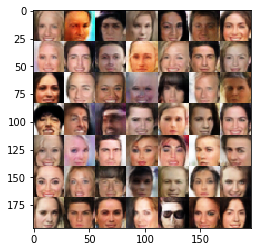

Epoch 7/8... Discriminator Loss: 0.9695... Generator Loss: 0.5755
Epoch 7/8... Discriminator Loss: 0.7849... Generator Loss: 1.4234
Epoch 7/8... Discriminator Loss: 0.8203... Generator Loss: 2.0182
Epoch 7/8... Discriminator Loss: 1.2867... Generator Loss: 1.2118
Epoch 7/8... Discriminator Loss: 0.6873... Generator Loss: 1.4577
Epoch 7/8... Discriminator Loss: 1.0052... Generator Loss: 1.2295
Epoch 7/8... Discriminator Loss: 0.6430... Generator Loss: 1.1684
Epoch 7/8... Discriminator Loss: 1.1014... Generator Loss: 1.4284
Epoch 7/8... Discriminator Loss: 0.8867... Generator Loss: 0.8578
Epoch 7/8... Discriminator Loss: 1.2753... Generator Loss: 0.9010
Epoch 7/8... Discriminator Loss: 1.0391... Generator Loss: 1.2021
Epoch 7/8... Discriminator Loss: 0.7854... Generator Loss: 1.5711
Epoch 7/8... Discriminator Loss: 1.3605... Generator Loss: 1.1079
Epoch 7/8... Discriminator Loss: 1.0124... Generator Loss: 1.0676
Epoch 7/8... Discriminator Loss: 0.7326... Generator Loss: 0.5830
Epoch 7/8.

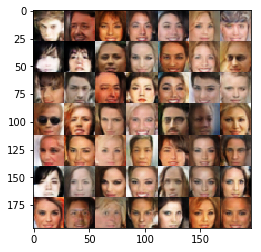

Epoch 7/8... Discriminator Loss: 0.6055... Generator Loss: 1.0725
Epoch 7/8... Discriminator Loss: 0.8566... Generator Loss: 1.1172
Epoch 7/8... Discriminator Loss: 1.0161... Generator Loss: 0.7805
Epoch 7/8... Discriminator Loss: 1.0006... Generator Loss: 0.7245
Epoch 7/8... Discriminator Loss: 0.7958... Generator Loss: 1.8919
Epoch 7/8... Discriminator Loss: 1.0228... Generator Loss: 0.7609
Epoch 7/8... Discriminator Loss: 1.2027... Generator Loss: 0.9181
Epoch 7/8... Discriminator Loss: 1.0423... Generator Loss: 0.8013
Epoch 7/8... Discriminator Loss: 1.1813... Generator Loss: 0.9362
Epoch 7/8... Discriminator Loss: 1.0537... Generator Loss: 0.9143
Epoch 7/8... Discriminator Loss: 1.7123... Generator Loss: 0.6670
Epoch 7/8... Discriminator Loss: 1.2261... Generator Loss: 0.5046
Epoch 7/8... Discriminator Loss: 1.0748... Generator Loss: 0.7802
Epoch 7/8... Discriminator Loss: 0.8000... Generator Loss: 1.3768
Epoch 7/8... Discriminator Loss: 1.0369... Generator Loss: 0.9429
Epoch 7/8.

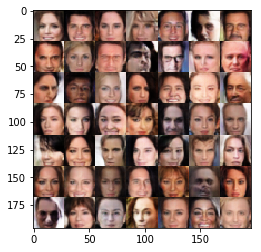

Epoch 7/8... Discriminator Loss: 1.0190... Generator Loss: 1.0819
Epoch 7/8... Discriminator Loss: 0.9192... Generator Loss: 1.1773
Epoch 7/8... Discriminator Loss: 0.7597... Generator Loss: 2.0254
Epoch 7/8... Discriminator Loss: 1.2796... Generator Loss: 0.8773
Epoch 7/8... Discriminator Loss: 0.3702... Generator Loss: 2.1226
Epoch 7/8... Discriminator Loss: 0.9389... Generator Loss: 0.8585
Epoch 7/8... Discriminator Loss: 0.8654... Generator Loss: 0.9822
Epoch 7/8... Discriminator Loss: 1.3069... Generator Loss: 1.0864
Epoch 7/8... Discriminator Loss: 1.3462... Generator Loss: 0.6125
Epoch 7/8... Discriminator Loss: 1.3073... Generator Loss: 1.0369
Epoch 7/8... Discriminator Loss: 0.9373... Generator Loss: 1.0210
Epoch 7/8... Discriminator Loss: 1.3402... Generator Loss: 1.2018
Epoch 7/8... Discriminator Loss: 0.6977... Generator Loss: 4.1750
Epoch 7/8... Discriminator Loss: 1.2789... Generator Loss: 1.3995
Epoch 7/8... Discriminator Loss: 1.1386... Generator Loss: 0.9440
Epoch 7/8.

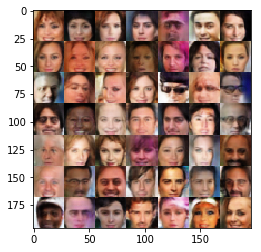

Epoch 7/8... Discriminator Loss: 1.1067... Generator Loss: 2.0494
Epoch 7/8... Discriminator Loss: 0.7178... Generator Loss: 1.7613
Epoch 7/8... Discriminator Loss: 0.8891... Generator Loss: 1.3976
Epoch 7/8... Discriminator Loss: 0.9319... Generator Loss: 1.5021
Epoch 7/8... Discriminator Loss: 0.8518... Generator Loss: 1.1281
Epoch 7/8... Discriminator Loss: 1.0911... Generator Loss: 1.0414
Epoch 7/8... Discriminator Loss: 0.6899... Generator Loss: 1.6116
Epoch 7/8... Discriminator Loss: 0.5608... Generator Loss: 1.2746
Epoch 7/8... Discriminator Loss: 1.6886... Generator Loss: 1.9667
Epoch 7/8... Discriminator Loss: 1.0139... Generator Loss: 0.9446
Epoch 7/8... Discriminator Loss: 0.7096... Generator Loss: 1.1660
Epoch 7/8... Discriminator Loss: 1.0512... Generator Loss: 1.1260
Epoch 7/8... Discriminator Loss: 0.9434... Generator Loss: 0.8261
Epoch 7/8... Discriminator Loss: 0.9872... Generator Loss: 1.0091
Epoch 7/8... Discriminator Loss: 1.6803... Generator Loss: 1.1528
Epoch 7/8.

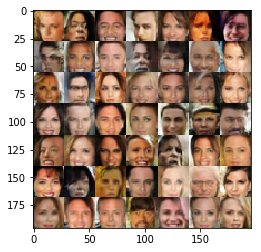

Epoch 7/8... Discriminator Loss: 0.9804... Generator Loss: 1.5216
Epoch 7/8... Discriminator Loss: 0.9538... Generator Loss: 1.8705
Epoch 7/8... Discriminator Loss: 1.0752... Generator Loss: 1.0764
Epoch 7/8... Discriminator Loss: 0.3743... Generator Loss: 2.6755
Epoch 7/8... Discriminator Loss: 1.0013... Generator Loss: 0.7423
Epoch 7/8... Discriminator Loss: 0.9589... Generator Loss: 1.7489
Epoch 7/8... Discriminator Loss: 0.6863... Generator Loss: 1.0511
Epoch 7/8... Discriminator Loss: 0.9846... Generator Loss: 1.4882
Epoch 7/8... Discriminator Loss: 1.1207... Generator Loss: 0.8629
Epoch 7/8... Discriminator Loss: 0.5439... Generator Loss: 1.0565
Epoch 7/8... Discriminator Loss: 1.2554... Generator Loss: 0.7860
Epoch 7/8... Discriminator Loss: 1.2707... Generator Loss: 0.7004
Epoch 7/8... Discriminator Loss: 0.5387... Generator Loss: 3.7582
Epoch 7/8... Discriminator Loss: 0.9227... Generator Loss: 0.9138
Epoch 7/8... Discriminator Loss: 0.5495... Generator Loss: 2.5096
Epoch 7/8.

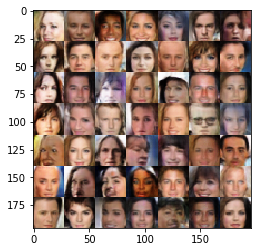

Epoch 7/8... Discriminator Loss: 0.8262... Generator Loss: 0.5180
Epoch 7/8... Discriminator Loss: 0.2835... Generator Loss: 3.6639
Epoch 7/8... Discriminator Loss: 0.9434... Generator Loss: 1.0596
Epoch 7/8... Discriminator Loss: 1.2809... Generator Loss: 0.3772
Epoch 7/8... Discriminator Loss: 0.9662... Generator Loss: 1.2784
Epoch 7/8... Discriminator Loss: 0.6046... Generator Loss: 1.5801
Epoch 7/8... Discriminator Loss: 0.9240... Generator Loss: 0.7910
Epoch 7/8... Discriminator Loss: 1.2773... Generator Loss: 0.4021
Epoch 7/8... Discriminator Loss: 0.6120... Generator Loss: 1.9768
Epoch 7/8... Discriminator Loss: 0.4096... Generator Loss: 2.4504
Epoch 7/8... Discriminator Loss: 1.1315... Generator Loss: 0.4569
Epoch 7/8... Discriminator Loss: 0.9564... Generator Loss: 1.0377
Epoch 7/8... Discriminator Loss: 1.0234... Generator Loss: 0.8945
Epoch 7/8... Discriminator Loss: 0.4270... Generator Loss: 2.7402
Epoch 7/8... Discriminator Loss: 1.2003... Generator Loss: 2.4386
Epoch 7/8.

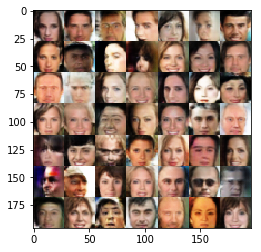

Epoch 7/8... Discriminator Loss: 1.4609... Generator Loss: 2.3489
Epoch 7/8... Discriminator Loss: 1.1143... Generator Loss: 1.1504
Epoch 7/8... Discriminator Loss: 1.2015... Generator Loss: 0.5832
Epoch 7/8... Discriminator Loss: 1.2218... Generator Loss: 1.7058
Epoch 7/8... Discriminator Loss: 0.8797... Generator Loss: 1.4106
Epoch 7/8... Discriminator Loss: 1.2881... Generator Loss: 0.9115
Epoch 7/8... Discriminator Loss: 1.1101... Generator Loss: 0.9595
Epoch 7/8... Discriminator Loss: 1.4469... Generator Loss: 0.4874
Epoch 7/8... Discriminator Loss: 1.1980... Generator Loss: 0.6601
Epoch 7/8... Discriminator Loss: 1.3283... Generator Loss: 0.5591
Epoch 7/8... Discriminator Loss: 0.9507... Generator Loss: 1.8585
Epoch 7/8... Discriminator Loss: 0.9284... Generator Loss: 0.9440
Epoch 7/8... Discriminator Loss: 1.3653... Generator Loss: 0.8328
Epoch 7/8... Discriminator Loss: 1.1412... Generator Loss: 1.1112
Epoch 7/8... Discriminator Loss: 1.1198... Generator Loss: 0.8077
Epoch 7/8.

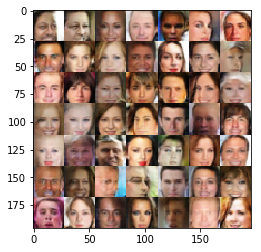

Epoch 7/8... Discriminator Loss: 0.2849... Generator Loss: 2.5982
Epoch 7/8... Discriminator Loss: 0.8306... Generator Loss: 1.1301
Epoch 7/8... Discriminator Loss: 0.5582... Generator Loss: 1.4804
Epoch 7/8... Discriminator Loss: 0.7651... Generator Loss: 1.2015
Epoch 7/8... Discriminator Loss: 0.7735... Generator Loss: 1.6705
Epoch 7/8... Discriminator Loss: 1.3914... Generator Loss: 1.4377
Epoch 7/8... Discriminator Loss: 1.3405... Generator Loss: 0.6273
Epoch 7/8... Discriminator Loss: 1.1980... Generator Loss: 0.9699
Epoch 7/8... Discriminator Loss: 0.7476... Generator Loss: 1.5842
Epoch 7/8... Discriminator Loss: 0.8265... Generator Loss: 1.4387
Epoch 7/8... Discriminator Loss: 1.3715... Generator Loss: 0.9505
Epoch 7/8... Discriminator Loss: 0.9532... Generator Loss: 0.9614
Epoch 7/8... Discriminator Loss: 1.0969... Generator Loss: 1.2197
Epoch 7/8... Discriminator Loss: 1.1565... Generator Loss: 1.1221
Epoch 7/8... Discriminator Loss: 0.5508... Generator Loss: 1.4902
Epoch 7/8.

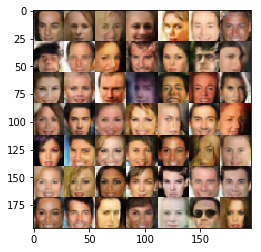

Epoch 7/8... Discriminator Loss: 1.4099... Generator Loss: 1.4546
Epoch 7/8... Discriminator Loss: 0.9554... Generator Loss: 1.4395
Epoch 8/8... Discriminator Loss: 1.1885... Generator Loss: 0.8237
Epoch 8/8... Discriminator Loss: 1.0869... Generator Loss: 1.5341
Epoch 8/8... Discriminator Loss: 1.0669... Generator Loss: 0.6434
Epoch 8/8... Discriminator Loss: 1.3126... Generator Loss: 0.7802
Epoch 8/8... Discriminator Loss: 0.4988... Generator Loss: 1.4491
Epoch 8/8... Discriminator Loss: 0.9144... Generator Loss: 1.1219
Epoch 8/8... Discriminator Loss: 0.9969... Generator Loss: 1.3201
Epoch 8/8... Discriminator Loss: 0.8738... Generator Loss: 1.9146
Epoch 8/8... Discriminator Loss: 0.5940... Generator Loss: 2.6131
Epoch 8/8... Discriminator Loss: 0.9710... Generator Loss: 1.4641
Epoch 8/8... Discriminator Loss: 1.2204... Generator Loss: 1.0636
Epoch 8/8... Discriminator Loss: 1.0485... Generator Loss: 0.9667
Epoch 8/8... Discriminator Loss: 1.0284... Generator Loss: 1.4283
Epoch 8/8.

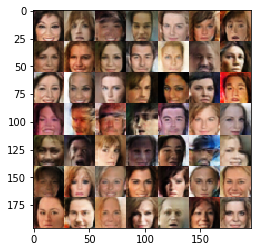

Epoch 8/8... Discriminator Loss: 1.1713... Generator Loss: 1.2594
Epoch 8/8... Discriminator Loss: 0.9643... Generator Loss: 1.0476
Epoch 8/8... Discriminator Loss: 1.2668... Generator Loss: 0.4286
Epoch 8/8... Discriminator Loss: 0.6696... Generator Loss: 1.2878
Epoch 8/8... Discriminator Loss: 0.8935... Generator Loss: 0.9109
Epoch 8/8... Discriminator Loss: 0.7207... Generator Loss: 1.7342
Epoch 8/8... Discriminator Loss: 0.8286... Generator Loss: 1.4360
Epoch 8/8... Discriminator Loss: 1.0075... Generator Loss: 1.8163
Epoch 8/8... Discriminator Loss: 0.8170... Generator Loss: 2.0680
Epoch 8/8... Discriminator Loss: 0.4289... Generator Loss: 4.2628
Epoch 8/8... Discriminator Loss: 1.1400... Generator Loss: 0.8872
Epoch 8/8... Discriminator Loss: 1.1484... Generator Loss: 0.7016
Epoch 8/8... Discriminator Loss: 0.6011... Generator Loss: 2.9302
Epoch 8/8... Discriminator Loss: 1.1997... Generator Loss: 1.0497
Epoch 8/8... Discriminator Loss: 1.0277... Generator Loss: 1.0987
Epoch 8/8.

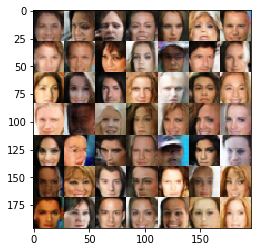

Epoch 8/8... Discriminator Loss: 0.8652... Generator Loss: 1.4332
Epoch 8/8... Discriminator Loss: 1.1120... Generator Loss: 1.7052
Epoch 8/8... Discriminator Loss: 1.1396... Generator Loss: 0.6638
Epoch 8/8... Discriminator Loss: 0.8302... Generator Loss: 1.4245
Epoch 8/8... Discriminator Loss: 0.8398... Generator Loss: 0.9627
Epoch 8/8... Discriminator Loss: 1.0352... Generator Loss: 0.9610
Epoch 8/8... Discriminator Loss: 1.3267... Generator Loss: 1.6203
Epoch 8/8... Discriminator Loss: 1.0998... Generator Loss: 1.0335
Epoch 8/8... Discriminator Loss: 0.7739... Generator Loss: 1.4953
Epoch 8/8... Discriminator Loss: 1.1863... Generator Loss: 0.7093
Epoch 8/8... Discriminator Loss: 1.1373... Generator Loss: 1.0087
Epoch 8/8... Discriminator Loss: 1.4943... Generator Loss: 1.4838
Epoch 8/8... Discriminator Loss: 0.1604... Generator Loss: 6.1317
Epoch 8/8... Discriminator Loss: 1.1257... Generator Loss: 1.1305
Epoch 8/8... Discriminator Loss: 1.1772... Generator Loss: 1.4630
Epoch 8/8.

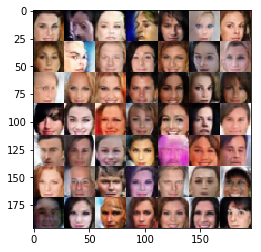

Epoch 8/8... Discriminator Loss: 1.3363... Generator Loss: 1.1342
Epoch 8/8... Discriminator Loss: 1.0308... Generator Loss: 1.6065
Epoch 8/8... Discriminator Loss: 1.1192... Generator Loss: 0.8715
Epoch 8/8... Discriminator Loss: 0.8930... Generator Loss: 1.3273
Epoch 8/8... Discriminator Loss: 1.0369... Generator Loss: 1.3426
Epoch 8/8... Discriminator Loss: 0.8575... Generator Loss: 0.7657
Epoch 8/8... Discriminator Loss: 1.2319... Generator Loss: 1.1223
Epoch 8/8... Discriminator Loss: 0.9980... Generator Loss: 0.9499
Epoch 8/8... Discriminator Loss: 0.2011... Generator Loss: 4.2659
Epoch 8/8... Discriminator Loss: 0.5692... Generator Loss: 3.0190
Epoch 8/8... Discriminator Loss: 1.0290... Generator Loss: 1.6425
Epoch 8/8... Discriminator Loss: 1.0343... Generator Loss: 1.6991
Epoch 8/8... Discriminator Loss: 1.0250... Generator Loss: 0.9370
Epoch 8/8... Discriminator Loss: 1.2531... Generator Loss: 1.4689
Epoch 8/8... Discriminator Loss: 0.2815... Generator Loss: 2.8439
Epoch 8/8.

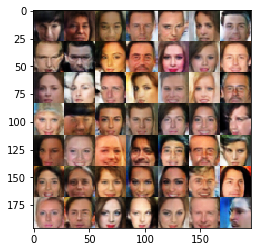

Epoch 8/8... Discriminator Loss: 1.3000... Generator Loss: 0.8525
Epoch 8/8... Discriminator Loss: 1.2705... Generator Loss: 1.0003
Epoch 8/8... Discriminator Loss: 1.4460... Generator Loss: 1.5376
Epoch 8/8... Discriminator Loss: 1.1069... Generator Loss: 0.4700
Epoch 8/8... Discriminator Loss: 0.4199... Generator Loss: 4.2850
Epoch 8/8... Discriminator Loss: 0.8967... Generator Loss: 1.0171
Epoch 8/8... Discriminator Loss: 1.0273... Generator Loss: 0.5880
Epoch 8/8... Discriminator Loss: 1.3408... Generator Loss: 0.8128
Epoch 8/8... Discriminator Loss: 0.6519... Generator Loss: 0.8377
Epoch 8/8... Discriminator Loss: 0.8279... Generator Loss: 0.5966
Epoch 8/8... Discriminator Loss: 1.3762... Generator Loss: 0.6673
Epoch 8/8... Discriminator Loss: 1.1768... Generator Loss: 3.3096
Epoch 8/8... Discriminator Loss: 0.1098... Generator Loss: 5.6629
Epoch 8/8... Discriminator Loss: 1.1576... Generator Loss: 0.5816
Epoch 8/8... Discriminator Loss: 0.4598... Generator Loss: 1.9361
Epoch 8/8.

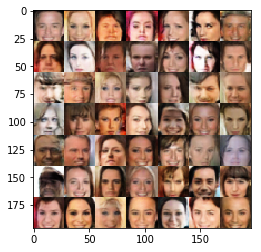

Epoch 8/8... Discriminator Loss: 0.6344... Generator Loss: 0.6863
Epoch 8/8... Discriminator Loss: 0.9597... Generator Loss: 1.5298
Epoch 8/8... Discriminator Loss: 0.1472... Generator Loss: 1.8233
Epoch 8/8... Discriminator Loss: 1.0241... Generator Loss: 1.0046
Epoch 8/8... Discriminator Loss: 0.4503... Generator Loss: 2.0308
Epoch 8/8... Discriminator Loss: 0.3423... Generator Loss: 1.9314
Epoch 8/8... Discriminator Loss: 0.2179... Generator Loss: 4.2703
Epoch 8/8... Discriminator Loss: 0.6859... Generator Loss: 1.2456
Epoch 8/8... Discriminator Loss: 1.5627... Generator Loss: 0.3262
Epoch 8/8... Discriminator Loss: 0.3343... Generator Loss: 3.4791
Epoch 8/8... Discriminator Loss: 1.1012... Generator Loss: 0.4049
Epoch 8/8... Discriminator Loss: 0.6874... Generator Loss: 1.2648
Epoch 8/8... Discriminator Loss: 0.9682... Generator Loss: 1.3644
Epoch 8/8... Discriminator Loss: 0.4440... Generator Loss: 2.9208
Epoch 8/8... Discriminator Loss: 0.2060... Generator Loss: 3.3972
Epoch 8/8.

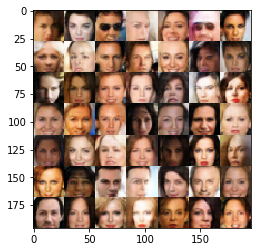

Epoch 8/8... Discriminator Loss: 0.8955... Generator Loss: 0.8284
Epoch 8/8... Discriminator Loss: 0.8486... Generator Loss: 1.6479
Epoch 8/8... Discriminator Loss: 0.6560... Generator Loss: 1.2766
Epoch 8/8... Discriminator Loss: 1.1124... Generator Loss: 0.7711
Epoch 8/8... Discriminator Loss: 0.8645... Generator Loss: 1.7117
Epoch 8/8... Discriminator Loss: 1.0302... Generator Loss: 1.5563
Epoch 8/8... Discriminator Loss: 1.1892... Generator Loss: 0.9483
Epoch 8/8... Discriminator Loss: 1.3164... Generator Loss: 1.0593
Epoch 8/8... Discriminator Loss: 0.7417... Generator Loss: 2.1943
Epoch 8/8... Discriminator Loss: 0.9054... Generator Loss: 1.6702
Epoch 8/8... Discriminator Loss: 0.3694... Generator Loss: 1.6976


In [ ]:
batch_size = 24
z_dim = 100
learning_rate = 0.0005
beta1 = 0.3

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 8

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.